# Figures for the paper

* PR curve
* confusion matrix using real data (with labels for N and %)
* MES vs recall plot

In [1]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### python packages
import os
from os import path
import numpy as np
import glob as glob
from random import random
import pandas as pd

### torch packages
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data.sampler import Sampler

### sklearn packages
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.model_selection import KFold

import pickle
### remove these later (for notebook version only)
from tqdm import tqdm_notebook as tqdm

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

%matplotlib inline
%config IPython.matplotlib.backend = "retina"
from matplotlib import rcParams
rcParams["savefig.dpi"] = 300
rcParams["figure.dpi"] = 300

In [2]:
def Assemble_dic(folder,modeltype='binary',use='tempdic'):
    if use=='tempdic':
        allfiles=glob.glob(path.join(folder,'exonet_CV_?.?_101_all_Big_tempdic.pickle'))
    else:
        allfiles=glob.glob(path.join(folder,'exonet_CV_?.?_101_all_Big_dic.pickle'))
    n_CVs=int(allfiles[0][allfiles[0].find('_101')-1])
    print(n_CVs)
    
    newoutputvals={}
    for n in range(n_CVs):
        print(n)
        try:
            #exonet_CV_6.8_101_all_Big_dic.pickle
            if use=='tempdic':
                fpath=path.join(folder,'exonet_CV_'+str(n)+'.'+str(n_CVs)+'_101_all_Big_tempdic.pickle')
                key=fpath.replace('_tempdic.pickle','')
            else:
                fpath=path.join(folder,'exonet_CV_'+str(n)+'.'+str(n_CVs)+'_101_all_Big_dic.pickle')
                key=fpath.replace('_dic.pickle','')
            outfiles=pickle.load(open(fpath,'rb'))

            newoutputvals[key]=outfiles
            newoutputvals[key]['k']=n
            newoutputvals[key]['val_files']=pickle.load(open(path.join(folder,'exonet_CV_'+str(n)+'.'+str(n_CVs)+'_101_all_Big_valfiles.pickle'),'rb'))
        except:
            print("cannot process")
    savedicname=folder.split('/')[-1]+'_dic'
    models={'Big':'ExtranetModel'};augment={'all':'all'}

    mod='Big';aug='all';fpath='101'

    dickeys=[key for key in newoutputvals if not np.isnan(float(newoutputvals[key]['k']))]

    all_dics={}
        
    if modeltype=='3class':
        arr_keys=['acc_val_epoch_pl','acc_val_epoch_unk', 'acc_val_epoch_ebs',
                  'ap_val_epoch','ap_val_epoch_pl','ap_val_epoch_unk','ap_val_epoch_ebs',
                  'recall_val_epoch_pl','recall_val_epoch_unk','recall_val_epoch_ebs',
                  'loss_train_epoch','pred_val_final', 'gt_val_final','loss_val_epoch','val_files']

    elif modeltype=='4class':
        arr_keys=['acc_val_epoch_pl','acc_val_epoch_unk', 'acc_val_epoch_ebs','acc_val_epoch_bebs',
                  'ap_val_epoch','ap_val_epoch_pl','ap_val_epoch_unk','ap_val_epoch_ebs','ap_val_epoch_bebs',
                  'recall_val_epoch_pl','recall_val_epoch_unk','recall_val_epoch_ebs','recall_val_epoch_bebs',
                  'loss_train_epoch','pred_val_final', 'gt_val_final','loss_val_epoch','val_files']
    else:
        #binary
        arr_keys=['acc_val_epoch','ap_val_epoch','loss_train_epoch','pred_val_final', 'gt_val_final','loss_val_epoch','val_files']
        

    #initialising:

    for key in dickeys:
        for key2 in arr_keys:
            if len(newoutputvals[key][key2])>0 and type(newoutputvals[key][key2])==list and type(newoutputvals[key][key2][-1])==list:
                arr2dic=np.array(newoutputvals[key][key2][:-1])
            else:
                arr2dic=np.array(newoutputvals[key][key2])
            if len(np.shape(arr2dic))==2:
                if np.shape(arr2dic)[1]<=1:
                    if key2 in all_dics:
                        all_dics[key2]=np.hstack((all_dics[key2].ravel(),arr2dic.ravel()))
                    else:
                        all_dics[key2]=arr2dic.ravel()
                else:
                    if key2 in all_dics:
                        all_dics[key2]=np.vstack((all_dics[key2],arr2dic))
                    else:
                        all_dics[key2]=arr2dic
            elif len(np.shape(newoutputvals[key][key2]))==1:
                if key2 in all_dics:
                    all_dics[key2]=np.hstack((all_dics[key2],arr2dic))
                else:
                    all_dics[key2]=arr2dic
    return newoutputvals,all_dics
    

In [3]:
def MakePR(dic,folder,modeltype='binary'):
    plt.figure(figsize=(6,6))
    if modeltype=='binary':
        labels=['PL']
        P, R, _ =precision_recall_curve(dic['gt_val_final'],dic['pred_val_final'])
        plt.step(R, P,linewidth=2.5,label=modeltype+' model')
        plt.plot([0,1],[1,0],linewidth=2.5,label='random')

    else:
        if modeltype=='3class':
            labels=['UNK','PL','EBs']
        elif modeltype=='4class':
            labels=['UNK','PL','EB','BEB']
        one_hot_gt=make_one_hot(dic['gt_val_final'],len(labels))
        ### plot values
        for n in range(len(labels)):
            P, R, _ =precision_recall_curve(one_hot_gt[:,n],dic['pred_val_final'][:,n])
            plt.step(R, P,label=labels[n],linewidth=2.5)
    plt.legend()
    
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.savefig(path.join('/home/hosborn/TESS/PaperFigures',folder[:-1].split('/')[-1]+'_PR.png'))
    plt.savefig(path.join('/home/hosborn/TESS/PaperFigures',folder[:-1].split('/')[-1]+'_PR.pdf'))
    plt.savefig(path.join(folder,folder[:-1].split('/')[-1]+'_PR.png'))
    plt.savefig(path.join(folder,folder[:-1].split('/')[-1]+'_PR.pdf'))

In [4]:
def make_one_hot(labels, C=3):
    '''
    Converts an integer label torch.autograd.Variable to a one-hot Variable.
    
    Parameters
    ----------
    labels : torch.autograd.Variable of torch.cuda.LongTensor
        N x 1 x H x W, where N is batch size. 
        Each value is an integer representing correct classification.
    C : integer. 
        number of classes in labels.
    
    Returns
    -------
    target : torch.autograd.Variable of torch.cuda.FloatTensor
        N x C x H x W, where C is class number. One-hot encoded.
    '''
    if type(labels)==list or type(labels)==np.ndarray:
        target=np.zeros((len(labels),C))
        target[np.arange(len(labels)), np.array(labels).astype(int)] = 1
    else:
        one_hot = torch.cuda.FloatTensor(labels.size(0), C, labels.size(2), labels.size(3)).zero_()
        target = one_hot.scatter_(1, labels.data, 1)

        target = Variable(target)
        
    return target


In [5]:
def ModelProgress(n_dics,folder,modeltype='binary',lossy=None):
    plt.figure(figsize=(12,12))
    if modeltype=='binary':
        labels=['NotPL','PL']
    else:
        if modeltype=='3class':
            labels=['UNK','PL','EBs']
        if modeltype=='4class':
            labels=['UNK','PL','EB','BEB']
    
    
    dickeys=[key for key in n_dics if not np.isnan(float(n_dics[key]['k']))]
    
    plt.subplot(2,2,1)
    plt.title('Loss per Epoch')
    #plt.plot(np.arange(len(loss_train_batch)), loss_train_batch,color=sns.color_palette()[0])
    #plt.plot(np.arange(len(loss_val_batch)), loss_val_batch,color=sns.color_palette()[1])
    for n,key in enumerate(dickeys):
        line=plt.plot(np.array(n_dics[key]['loss_train_epoch']),':',alpha=0.75,color=sns.color_palette()[n])
        plt.plot(np.array(n_dics[key]['loss_val_epoch']),'--',alpha=0.75,color=line[0].get_color())
        plt.plot([0.0,0.0],[0.0,0.0],'-',alpha=0.75,label="k="+str(n_dics[key]['k']),color=line[0].get_color())
    plt.plot([0.0,0.0],[0.0,0.0],'--',label='validation')
    plt.plot([0.0,0.0],[0.0,0.0],':',label='training')
    plt.legend(loc=1)
    if lossy is None:
        plt.ylim(0.009,0.014)
    else:
        plt.ylim(lossy)
    #plt.xlim(0.0,300)

    plt.subplot(2,2,2)
    plt.title('Average Precision per Epoch')
    #plt.plot(np.arange(len(ap_val_epoch)), ap_val_epoch)
    for key in dickeys:
        if modeltype is not 'binary':
            plt.plot(n_dics[key]['ap_val_epoch_pl'],':',alpha=0.75)
        line=plt.plot(n_dics[key]['ap_val_epoch'],'--',alpha=0.75)
        plt.plot([0.0,0.0],[0.0,0.0],'--',alpha=0.75,label="k="+str(n_dics[key]['k']),color=line[0].get_color())
    plt.legend(loc=4)
    plt.ylim(0.0,1.0)
    #plt.xlim(0.0,300)

    plt.subplot(2,2,3)
    plt.title('Accuracy per Epoch')
    if modeltype is not 'binary':
        if modeltype is '3class':
            markers={'acc_val_epoch_unk':'--b','acc_val_epoch_pl':'-r','acc_val_epoch_ebs':':g'}
        elif modeltype is '4class':
            markers={'acc_val_epoch_unk':'--b','acc_val_epoch_pl':'-r','acc_val_epoch_ebs':':g','acc_val_epoch_bebs':'-.m'}
        for key2 in markers.keys():
            for key in dickeys:
                plt.plot(n_dics[key][key2],markers[key2],alpha=0.75)
                plt.plot([0.0,0.0],[0.0,0.0],'-',alpha=0.75)
            plt.plot([0,0],[-1,-1],markers[key2],label=key2.split('_')[-1])
    else:
        for key in dickeys:
            plt.plot(n_dics[key]['acc_val_epoch'],':',alpha=0.75,label="k="+str(n_dics[key]['k']))

    #markers={'acc_val_epoch_unk':'--b','acc_val_epoch_pl':'-r','acc_val_epoch_ebs':':g','acc_val_epoch_bebs':'-.m'}
    #for key2 in ['acc_val_epoch_unk','acc_val_epoch_pl','acc_val_epoch_ebs','acc_val_epoch_bebs']:
    plt.ylim(0.0,1.0)
    #plt.plot([0,0],[-1,-1],markers[key2],label=key2.split('_')[-1])
    plt.legend(loc=4)
    
    #plt.ylim(0.0,1.0)
    #plt.xlim(0.0,300)
    plt.subplot(2,2,4)
    plt.title('Recall per Epoch')
    if modeltype is not 'binary':
        if modeltype is '3class':
            markers={'recall_val_epoch_unk':'--b','recall_val_epoch_pl':'-r','recall_val_epoch_ebs':':g'}
        elif modeltype is '4class':
            markers={'recall_val_epoch_unk':'--b','recall_val_epoch_pl':'-r','recall_val_epoch_ebs':':g','recall_val_epoch_bebs':'-.m'}
        for key2 in markers.keys():
            for key in dickeys:
                plt.plot(n_dics[key][key2],markers[key2],alpha=0.75)
                plt.plot([0.0,0.0],[0.0,0.0],'-',alpha=0.75)
            plt.plot([0,0],[-1,-1],markers[key2],label=key2.split('_')[-1])
        plt.legend(loc=4)
        plt.ylim(0.0,1.0)

    #else:
    #    for key in dickeys:
    #        plt.plot(n_dics[key][key2],'--b',alpha=0.75)
    
    
    plt.tight_layout()
    plt.savefig(path.join('/home/hosborn/TESS/PaperFigures',folder[:-1].split('/')[-1]+'_Progress.png'))
    #plt.savefig(path.join('/home/hosborn/TESS/PaperFigures',folder[:-1].split('/')[-1]+'_Progress.pdf'))
    plt.savefig(path.join(folder,folder[:-1].split('/')[-1]+'_Progress.png'))
    #plt.savefig(path.join(folder,folder[:-1].split('/')[-1]+'_Progress.pdf'))


In [6]:
import seaborn as sns
sns.set_palette("muted")

In [7]:
def MakeConfMat(dic,folder,sourcedat='/home/hosborn/TESS/processed_dv_101_centfixed/',modeltype='binary',lc2plot='global'):
        
    if modeltype=='binary':
        labels=['NotPL','PL']
    else:
        if modeltype=='3class':
            labels=['UNK','PL','EBs']
        if modeltype=='4class':
            labels=['UNK','PL','EB','BEB']
        
    if len(np.shape(dic['pred_val_final']))>1:
        #GT=make_one_hot(all_dics['gt_val_final'],len(labels))
        confmat_abs=pd.DataFrame(confusion_matrix(dic['gt_val_final'],np.argmax(dic['pred_val_final'],axis=1)),index=labels,columns=labels)
    else:
        confmat_abs=pd.DataFrame(confusion_matrix(dic['gt_val_final'],dic['pred_val_final']>0.5),index=labels,columns=labels)
    confmat_ref=pd.DataFrame.copy(confmat_abs)
    for ind in confmat_ref.index.values:
        confmat_ref.loc[ind]/=np.sum(confmat_ref.loc[ind].as_matrix())
        
    fig, axs = plt.subplots(nrows=len(labels), ncols=len(labels), sharex=True, sharey=True, figsize=(5+len(labels), 5+len(labels)))

    for n_pred in range(len(labels)):
        for n_gt in range(len(labels)):
            
            #Finding data
            axs[n_gt][n_pred].text(0.5, 0.94, (confmat_abs.loc[labels[n_gt]][labels[n_pred]]),
                horizontalalignment='center',
                verticalalignment='center',
                fontsize=18-2*len(labels),
                transform=axs[n_gt][n_pred].transAxes)
            accpt=100*confmat_ref.loc[labels[n_gt]][labels[n_pred]]
            axs[n_gt][n_pred].text(0.5, 0.86, "{0:.2g}".format(accpt)+'%',
                horizontalalignment='center',
                verticalalignment='center',
                fontsize=21-2*len(labels), color='red',
                transform=axs[n_gt][n_pred].transAxes)

            if modeltype=='binary':
                rand_file=np.random.choice(dic['val_files'][((dic['pred_val_final']>0.5).astype(int)==n_pred)*(dic['gt_val_final']==n_gt)],1)[0]
            else:
                rand_file=np.random.choice(dic['val_files'][(np.argmax(dic['pred_val_final'],axis=1)==n_pred)*(dic['gt_val_final']==n_gt)],1)[0]

            if '.pickle' in rand_file:
                #info=pickle.load(open(rand_file,'rb'))
                lcloc=np.nan_to_num(np.load(rand_file.replace('_info.pickle','_loc.npy')))
                lcglob=np.nan_to_num(np.load(rand_file.replace('_info.pickle','_glob.npy')))
            elif 'fo.npy' in rand_file:
                #info=np.load(rand_file)
                lcloc=np.nan_to_num(np.load(rand_file.replace('_info.npy','_loc.npy')))
                lcglob=np.nan_to_num(np.load(rand_file.replace('_info.npy','_glob.npy')))
            elif 'fo2.npy' in rand_file:
                #info=np.load(rand_file)
                lcloc=np.nan_to_num(np.load(rand_file.replace('_info2.npy','_loc.npy')))
                lcglob=np.nan_to_num(np.load(rand_file.replace('_info2.npy','_glob.npy')))

            if lc2plot=='global':
                axs[n_gt][n_pred].plot(np.linspace(-0.5,0.5,1001),lcglob[:,1],'.',alpha=0.5,color=sns.xkcd_rgb['amber'])
                axs[n_gt][n_pred].plot(np.linspace(-0.5,0.5,1001),lcglob[:,0],'.',alpha=0.66,color=sns.color_palette()[0])
                axs[n_gt][n_pred].set_xlim(-0.5,0.5)
            elif lc2plot=='local':
                axs[n_gt][n_pred].plot(np.linspace(-2.5,2.5,101),lcloc[:,1],'.',alpha=0.5,color=sns.xkcd_rgb['amber'])
                axs[n_gt][n_pred].plot(np.linspace(-2.5,2.5,101),lcloc[:,0],'.',alpha=0.66,color=sns.color_palette()[0])
                axs[n_gt][n_pred].set_xlim(-2.5,2.5)

            if n_gt==len(labels)-1:
                axs[n_gt][n_pred].set_xlabel(labels[n_pred],fontsize=13)
            else:
                axs[n_gt][n_pred].set_xticks([])

            if n_pred==0:
                axs[n_gt][n_pred].set_ylabel(labels[n_gt],fontsize=13)
            else:
                axs[n_gt][n_pred].set_yticks([])
            
            axs[n_gt][n_pred].set_ylim(-2.5,1.5)
            
            if n_pred==n_gt:
                accstr=str(hex(int('fa',16)-int(1.5*(np.clip(accpt,75,100)-75))))[2:]
                axs[n_gt][n_pred].set_facecolor('#'+accstr+'FF'+accstr)
            else:
                accstr=str(hex(int('fa',16)-int(2*accpt)))[2:]
                axs[n_gt][n_pred].set_facecolor('#FF'+accstr+accstr)
            ### plot values
    fig.text(0.5, 0.005, 'Predicted', ha='center',fontsize=18)
    fig.text(0.005, 0.5, 'Ground Truth', va='center', rotation='vertical',fontsize=18)
    if modeltype=='3class':
        plt.tight_layout(rect=[0.012,0.012,1,1])
    else:
        plt.tight_layout()
    plt.savefig(path.join('/home/hosborn/TESS/PaperFigures',folder[:-1].split('/')[-1]+'_ConfMat.png'))
    plt.savefig(path.join('/home/hosborn/TESS/PaperFigures',folder[:-1].split('/')[-1]+'_ConfMat.pdf'))
    plt.savefig(path.join(folder,folder[:-1].split('/')[-1]+'_ConfMat.png'))
    plt.savefig(path.join(folder,folder[:-1].split('/')[-1]+'_ConfMat.pdf'))


In [55]:
info2collist=['TPERIOD','TDUR','DRRATIO','NTRANS','TSNR','TDEPTH','INDUR',
         'SESMES_LOG_RATIO','PRAD_LOG_RATIO','TDUR_LOG_RATIO','RADRATIO','IMPACT',
         'TESSMAG','RADIUS','PMTOTAL','LOGG','MH','TEFF']
infocollist=',kepid,tce_period,tce_time0bk,tce_duration,tce_depth,tce_plnt_num,tce_label,log10Metallicity,log10SurfaceGravity,effectiveTemp,allTransitsFit_starRadiusSolarRadii,allTransitsFit_starDensitySolarDensity,decDegrees,raDegrees,pmRa,pmDec,tessMag,det_MES,exp_MES,sector,label_complex,old_tce_label'.split(',')

def MakeMESplotDic(dic,folder,by='snr',bins=None,nbins=15,modeltype='binary'):
    #Makes plot of recall and accuracy vs MES
    #Assembling MES from pickle dicts:
    if modeltype is 'binary':
        classes={'UNK':0,'PL':1,'EB':0,'BEB':0}
    elif modeltype is '3class':
        classes={'UNK':0,'PL':1,'EB':2,'BEB':2}
    elif modeltype is '4class':
        classes={'UNK':0,'PL':1,'EB':2,'BEB':3}
        
    df=pd.DataFrame()
    if 'pickle' in dic['val_files'][0]:
        picklefromdifferentfile=False
    else:
        picklefromdifferentfile=True
    for n in range(len(dic['val_files'])):
        file=dic['val_files'][n]
        idx=file.split('/')[-1][:18]
        if picklefromdifferentfile:
            info=pickle.load(open('/home/hosborn/TESS/processed_dvpdc_pickleonly/'+idx+'_view_info.pickle','rb'))
        else:
            info=pickle.load(open(file,'rb'))

        if modeltype is 'binary':
            pred=int(dic['pred_val_final'][n]>0.5)
        else:
            pred=np.argmax(dic['pred_val_final'][n])
        df=df.append(pd.Series({'mes':info['MAXMES'],'snr':info['TSNR'],'depth':info['TDEPTH'],
                                'per':info['TPERIOD'],'gt_class':classes[info['tce_label']],'pred_class':pred},name=file.split('/')[-1][:18]))
    else:
        for n in range(len(dic['val_files'])):
            #Getting pickle file from direct:
            '''
            info=np.load(dic['val_files'][n],encoding='latin1')
            classes={'UNK':0,'PL':1,'EB':2,'BEB':3}
            if modeltype is 'binary':
                pred=int(dic['pred_val_final'][n]>0.5)
            else:
                pred=np.argmax(dic['pred_val_final'][n])
            if all_dics['val_files'][n][-9:]=='info2.npy':
                collist=infocollist+info2collist
                df=df.append(pd.Series({'mes':float(info[collist.index('det_MES')]),'snr':float(info[collist.index('TSNR')]),'depth':float(info[collist.index('TDEPTH')]),
                                        'per':float(info[collist.index('TPERIOD')]),'gt_class':dic['gt_val_final'][n],'pred_class':pred},name=idx))
            else:
                collist=infocollist
                df=df.append(pd.Series({'mes':float(info[collist.index('det_MES')]),'snr':float(info[collist.index('exp_MES')]),'depth':float(info[collist.index('tce_depth')]),
                                        'per':float(info[collist.index('tce_period')]),'gt_class':dic['gt_val_final'][n],'pred_class':pred},name=idx))
            '''
    return df


def MakeMESplot(df,folder,by='snr',bins=None,nbins=15,modeltype='binary'):
    if bins is None:
        bins=np.logspace(np.log10(7),np.log10(150),nbins)
    #Assembling MES from pickle dicts:
    classes={'UNK':0,'PL':1,'EB':2,'BEB':3}
    if modeltype is 'binary':
        array=np.zeros((len(bins),5))
        for b in range(len(bins)-1):
            bbin=df.loc[(df[by].values>bins[b])*(df[by].values<=bins[b+1])]
            print('acc',b,np.sum((bbin.gt_class==1)*(bbin.pred_class==1))/np.sum(bbin.pred_class==1))
            array[b,1]= np.sum((bbin.gt_class==1)*(bbin.pred_class==1))/np.sum(bbin.pred_class==1) # accuracy
            array[b,2]=1.0/np.sqrt(np.sum((df[by].values>bins[b])*(df[by].values<=bins[b+1]))) # poisson error
            print('recall',b,np.sum((bbin.gt_class==1)*(bbin.pred_class==1))/np.sum(bbin.gt_class==1))
            array[b,3]= np.sum((bbin.gt_class==1)*(bbin.pred_class==1))/np.sum(bbin.gt_class==1)   # recall
            array[b,4]=1.0/np.sqrt(np.sum((df[by].values>bins[b])*(df[by].values<=bins[b+1]))) # poisson error
        labels=['PL']
    else:
        if modeltype is '3class':
            labels=['UNK','PL','EB']
        elif modeltype is '4class':
            labels=['UNK','PL','EB','BEB']
        
        array=np.zeros((len(bins),1+len(labels)*4))
        for nlabel in range(len(labels)):
            label_n=classes[labels[nlabel]]
            for b in range(len(bins)-1):
                bbin=df.loc[(df[by].values>bins[b])*(df[by].values<=bins[b+1])]
                n_pred=np.sum(bbin.pred_class==label_n)
                print(labels[nlabel],'acc',b,np.sum((bbin.gt_class==label_n)*(bbin.pred_class==label_n))/n_pred)
                array[b,4*nlabel+1]= np.sum((bbin.gt_class==label_n)*(bbin.pred_class==label_n))/n_pred # accuracy
                array[b,4*nlabel+2]=1.0/np.sqrt(n_pred)
                n_corr=np.sum(bbin.gt_class==label_n)
                print(labels[nlabel],'rec',b,np.sum((bbin.gt_class==label_n)*(bbin.pred_class==label_n))/n_corr)
                array[b,4*nlabel+3]= np.sum((bbin.gt_class==label_n)*(bbin.pred_class==label_n))/n_corr   # recall
                array[b,4*nlabel+4]=1.0/np.sqrt(n_corr) # poisson error

    plt.figure(figsize=(6,6))
    
    array[:,0]=bins
    #array[:-1,0]+=0.5*np.diff(bins)
    #arr_x=array
    #Adding an extra row at the positive side of the bin with the same acc/recall
    arr_x=np.vstack((np.column_stack((array[:-1,0]+np.diff(array[:,0])*0.075,array[:-1,1:])),np.column_stack((array[1:,0]-np.diff(array[:,0])*0.075,array[:-1,1:]))))
    arr_x=arr_x[arr_x[:,0].argsort()]
    
    for nlabel in range(len(labels)):
        plt.subplot(211)
        

        filled=plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+1]-arr_x[:,nlabel*4+2], arr_x[:,nlabel*4+1]+arr_x[:,nlabel*4+2],alpha=0.5,linestyle='-',label=labels[nlabel],interpolate=True)
        plt.plot(arr_x[:,0], arr_x[:,nlabel*4+1],alpha=0.8,color = filled.get_facecolor()[0])
        #plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+1]-2*arr_x[:,nlabel*4+2], arr_x[:,nlabel*4+1]+2*arr_x[:,nlabel*4+2],alpha=0.25,linestyle='--',color = filled.get_facecolor())
        plt.subplot(212)
        filled2=plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+3]-arr_x[:,nlabel*4+4], arr_x[:,nlabel*4+3]+arr_x[:,nlabel*4+4],alpha=0.5,linestyle='-',label=labels[nlabel],interpolate=True)
        plt.plot(arr_x[:,0], arr_x[:,nlabel*4+3],alpha=0.8,color = filled.get_facecolor()[0])
        #plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+3]-2*arr_x[:,nlabel*4+4], arr_x[:,nlabel*4+3]+2*arr_x[:,nlabel*4+4],alpha=0.25,linestyle='--',color = filled2.get_facecolor(),label=labels[nlabel])
    
    if modeltype is not 'binary':
        plt.subplot(211)
        plt.legend(loc=8)
        plt.subplot(212)
        plt.legend(loc=8)
        
    plt.subplot(211)
    plt.ylabel('accuracy')
    plt.xscale('log')
    plt.xlim(bins[0],bins[-1])
    plt.gca().set_xticks([7, 10, 20, 40, 70, 100])
    plt.gca().set_xticklabels([])
    plt.ylim(0.0,1.05)
    
    plt.subplot(212)
    plt.ylabel('recall')
    plt.xlabel(by)
    
    plt.xscale('log')
    plt.xlim(bins[0],bins[-1])
    plt.gca().set_xticks([7, 10, 20, 40, 70, 100])
    plt.gca().set_xticklabels(["7", "10", "20", "40", "70", "100"])

    plt.ylim(0.0,1.05)
    
    plt.tight_layout()
    
    plt.savefig(path.join('/home/hosborn/TESS/PaperFigures',folder[:-1].split('/')[-1]+'_MESplot.png'))
    plt.savefig(path.join('/home/hosborn/TESS/PaperFigures',folder[:-1].split('/')[-1]+'_MESplot.pdf'))
    plt.savefig(path.join(folder,folder[:-1].split('/')[-1]+'_MESplot.png'))
    plt.savefig(path.join(folder,folder[:-1].split('/')[-1]+'_MESplot.pdf'))

    return df,arr_x

#outs=MakeMESplot(all_dics,fold,by='snr',bins=None,nbins=15,modeltype='4class',prev_df=outs[0])

In [13]:
all_dics['pred_val_final']
all_dics['gt_val_final']

{'acc_val_epoch': array([0.82443307, 0.82443307, 0.8302853 , ..., 0.97038391, 0.97111517,
        0.97294333]),
 'ap_val_epoch': array([0.33171552, 0.44662201, 0.46861952, ..., 0.94682995, 0.95487372,
        0.9592919 ]),
 'gt_val_final': array([0., 0., 0., ..., 1., 0., 0.]),
 'loss_train_epoch': array([0.02945527, 0.02782187, 0.02276435, ..., 0.00255579, 0.00262546,
        0.00244445], dtype=float32),
 'loss_val_epoch': array([0.00728244, 0.00617044, 0.00584469, ..., 0.00165108, 0.00159521,
        0.00161743]),
 'pred_val_final': array([2.28127277e-08, 1.23783422e-03, 1.64297624e-08, ...,
        3.84571463e-01, 3.93235711e-09, 1.24967536e-02]),
 'val_files': array(['/home/hosborn/TESS/processed_dv_101_centfixed2/all/000001479793_00_01_info2.npy',
        '/home/hosborn/TESS/processed_dv_101_centfixed2/all/000002214365_00_01_info2.npy',
        '/home/hosborn/TESS/processed_dv_101_centfixed2/all/000002214365_01_01_info2.npy',
        ...,
        '/home/hosborn/TESS/processed_dv_10

8
0
1
2
3
4
5
6
7
UNK ACCURACY: 0.9422783522630954  |  RECALL 0.9466916460870306
PL ACCURACY: 0.8871674948845367  |  RECALL 0.8701261467889908
EB ACCURACY: 0.8813651137594799  |  RECALL 0.8866485013623978
BEB ACCURACY: 0.8236682400539447  |  RECALL 0.8209005376344086
acerage precision  None  =  [0.96013406 0.90805965 0.91657864 0.85838923]
acerage precision  micro  =  0.9363497700763052
acerage precision  weighted  =  0.9306841072022808
acerage precision  micro  =  0.9363497700763052
acerage precision  macro  =  0.9107903930155483
acerage precision  samples  =  0.9484809007938321


/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:18: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


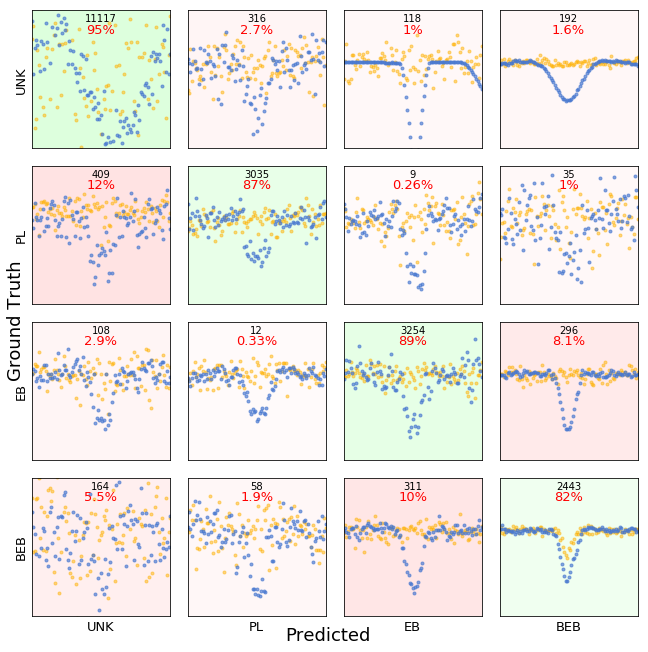

In [12]:
c4fold='/home/hosborn/TESS/final_runs/exonet_multiclass4_CV_globcents3b_k8'
c4newoutputvals,c4all_dics=Assemble_dic(c4fold,use='tempdic',modeltype='4class')
c4labels=['UNK','PL','EB','BEB']
for n in range(4):
    print(c4labels[n],'ACCURACY:',np.sum((c4all_dics['gt_val_final']==n)*(np.argmax(c4all_dics['pred_val_final'],axis=1)==n))/np.sum(np.argmax(c4all_dics['pred_val_final'],axis=1)==n),
          ' |  RECALL',np.sum((c4all_dics['gt_val_final']==n)*(np.argmax(c4all_dics['pred_val_final'],axis=1)==n))/np.sum(c4all_dics['gt_val_final']==n))

c4one_hot_labels=make_one_hot(c4all_dics['gt_val_final'],4)
aps=[]
for how in [None,"micro","weighted","micro","macro","samples"]:
    print("acerage precision ",how," = ",average_precision_score(c4one_hot_labels, c4all_dics['pred_val_final'], average=how))

#ModelProgress(c4newoutputvals,c4fold,modeltype='4class',lossy=None)
#MakePR(c4all_dics,c4fold,modeltype='4class')
MakeConfMat(c4all_dics,c4fold,sourcedat='/home/hosborn/TESS/processed_dvpdc_101/',modeltype='4class',lc2plot='local')
c4outdf=MakeMESplotDic(c4all_dics,c4fold,by='snr',bins=None,nbins=15,modeltype='4class')


/home/hosborn/.local/lib/python3.5/site-packages/pandas/core/computation/expressions.py:180: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
/home/hosborn/.local/lib/python3.5/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


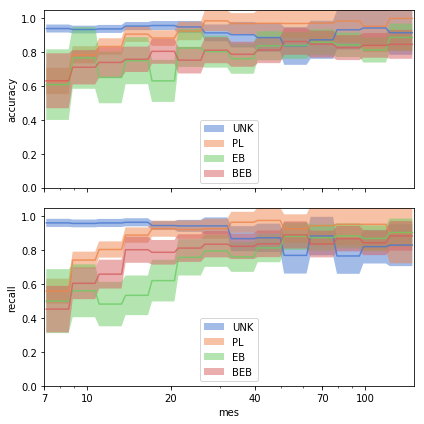

In [13]:
c4outdf,c4binarray=MakeMESplot(c4outdf,c4fold,by='mes',bins=None,nbins=15,modeltype='4class')

/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:18: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


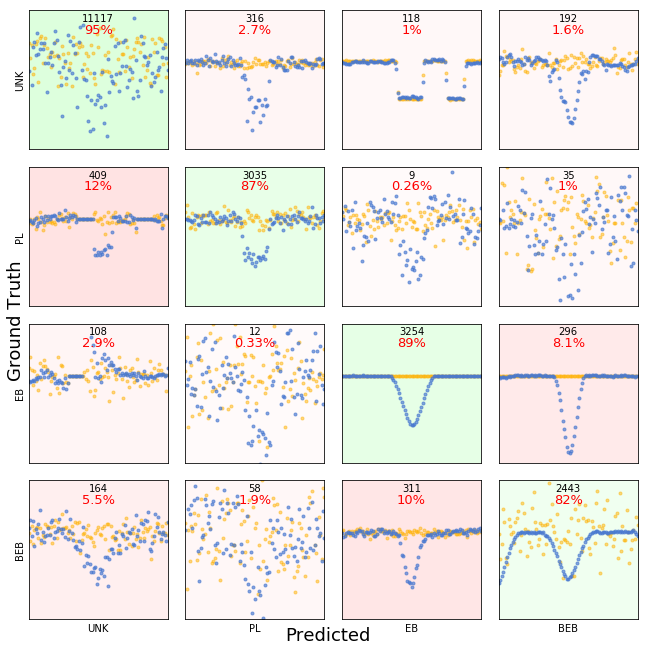

In [27]:
MakeConfMat(c4all_dics,c4fold,sourcedat='/home/hosborn/TESS/processed_dvpdc_101/',modeltype='4class',lc2plot='local')


/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:18: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


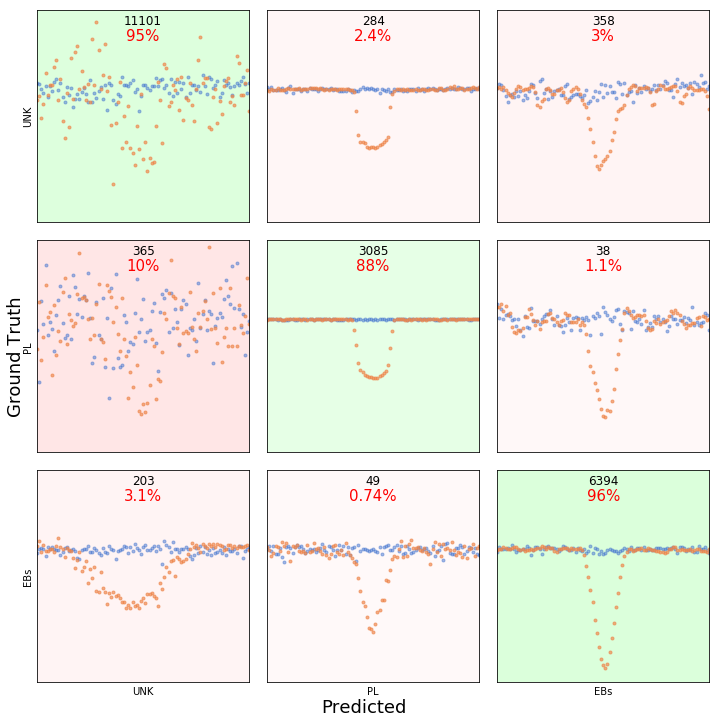

In [206]:
MakeConfMat(c3all_dics,c3fold,sourcedat='/home/hosborn/TESS/processed_dvpdc_101/',modeltype='3class',lc2plot='local')

8
0
1
2
3
4
5
6
7
UNK ACCURACY: 0.9513240209101037  |  RECALL 0.9453291322489994
PL ACCURACY: 0.9025746050321826  |  RECALL 0.8844610091743119
EB ACCURACY: 0.9416789396170839  |  RECALL 0.9620824556123985
average precision  None  =  [0.96867376 0.92761412 0.96054713]
average precision  micro  =  0.9609657533535764
average precision  weighted  =  0.9596585558889678
average precision  micro  =  0.9609657533535764
average precision  macro  =  0.9522783359777468
average precision  samples  =  0.968559065075955


/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:18: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
/home/hosborn/.local/lib/python3.5/site-packages/pandas/core/computation/expressions.py:180: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
/home/hosborn/.local/lib/python3.5/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


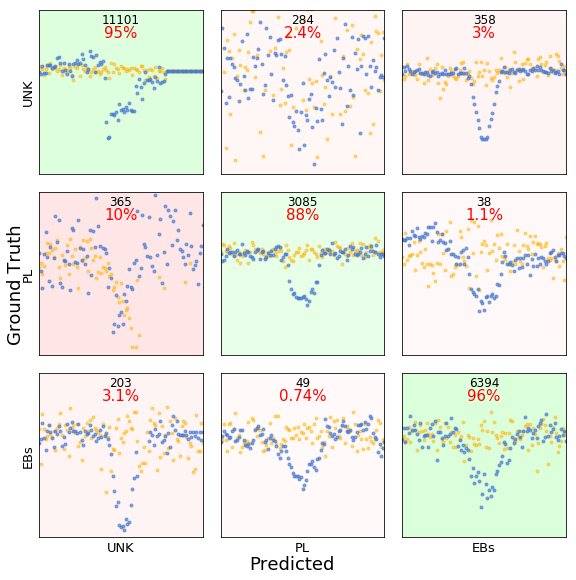

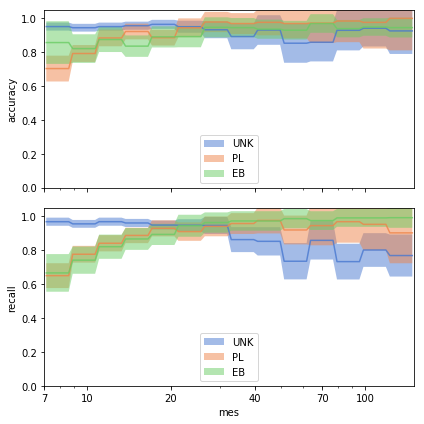

In [14]:
c3fold='/home/hosborn/TESS/final_runs/exonet_multiclass3_CV_globcents3b_k8'
c3newoutputvals,c3all_dics=Assemble_dic(c3fold,use='tempdic',modeltype='3class')

c3labels=['UNK','PL','EB']
for n in range(3):
    print(c3labels[n],'ACCURACY:',np.sum((c3all_dics['gt_val_final']==n)*(np.argmax(c3all_dics['pred_val_final'],axis=1)==n))/np.sum(np.argmax(c3all_dics['pred_val_final'],axis=1)==n),
          ' |  RECALL',np.sum((c3all_dics['gt_val_final']==n)*(np.argmax(c3all_dics['pred_val_final'],axis=1)==n))/np.sum(c3all_dics['gt_val_final']==n))

c3one_hot_labels=make_one_hot(c3all_dics['gt_val_final'],3)
aps=[]
for how in [None,"micro","weighted","micro","macro","samples"]:
    print("average precision ",how," = ",average_precision_score(c3one_hot_labels, c3all_dics['pred_val_final'], average=how))

#ModelProgress(c3newoutputvals,c3fold,modeltype='3class',lossy=None)
#MakePR(c3all_dics,c3fold,modeltype='3class')
MakeConfMat(c3all_dics,c3fold,sourcedat='/home/hosborn/TESS/processed_dvpdc_101/',modeltype='3class',lc2plot='local')
c3outdf=MakeMESplotDic(c3all_dics,c3fold,by='snr',bins=None,nbins=15,modeltype='3class')
c3outdf,c3binarray=MakeMESplot(c3outdf,c3fold,by='mes',bins=None,nbins=15,modeltype='3class')

/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:18: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


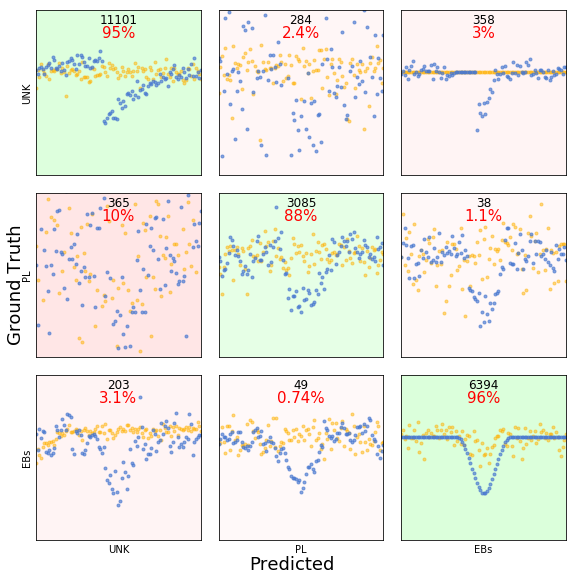

In [31]:
MakeConfMat(c3all_dics,c3fold,sourcedat='/home/hosborn/TESS/processed_dvpdc_101/',modeltype='3class',lc2plot='local')


8
0
1
2
3
4
5
6
7
UNK ACCURACY: 0.9768465677482472  |  RECALL 0.9773777801946816
PL ACCURACY: 0.8803910293271996  |  RECALL 0.8778669724770642
average precision  None  =  0.9389878534807629
average precision  micro  =  0.9389878534807629
average precision  weighted  =  0.9389878534807629
average precision  micro  =  0.9389878534807629
average precision  macro  =  0.9389878534807629
average precision  samples  =  0.9389878534807629


/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:18: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


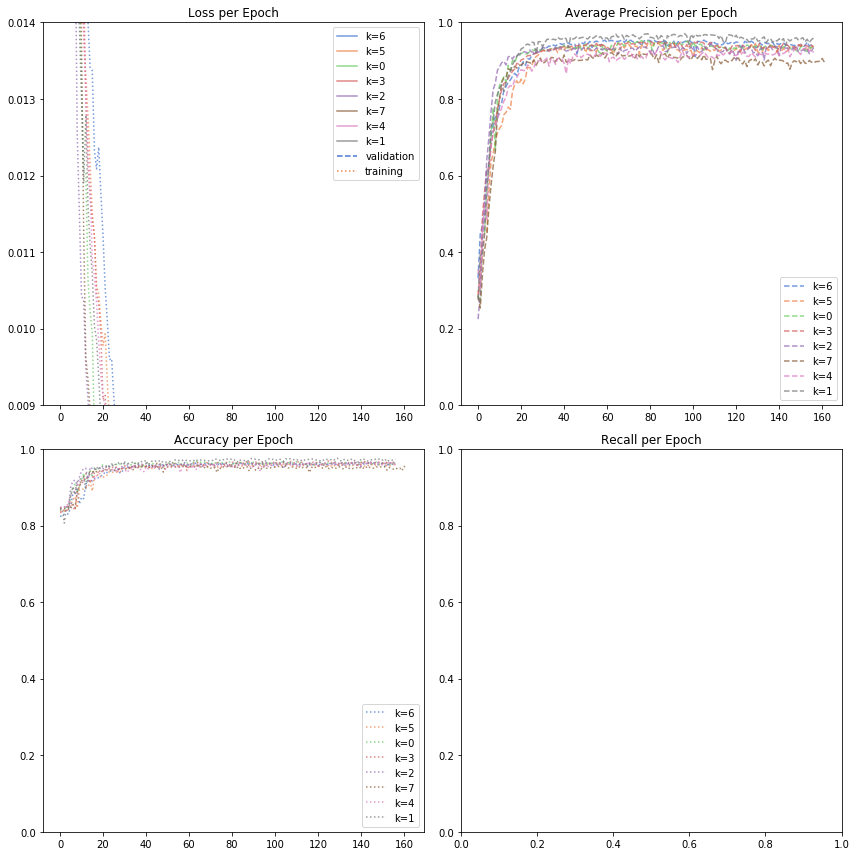

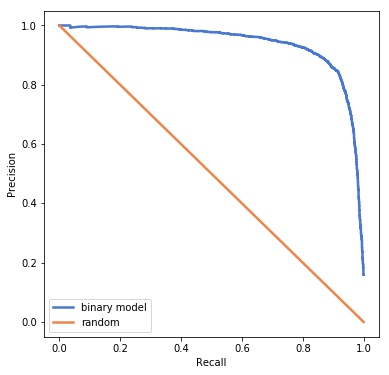

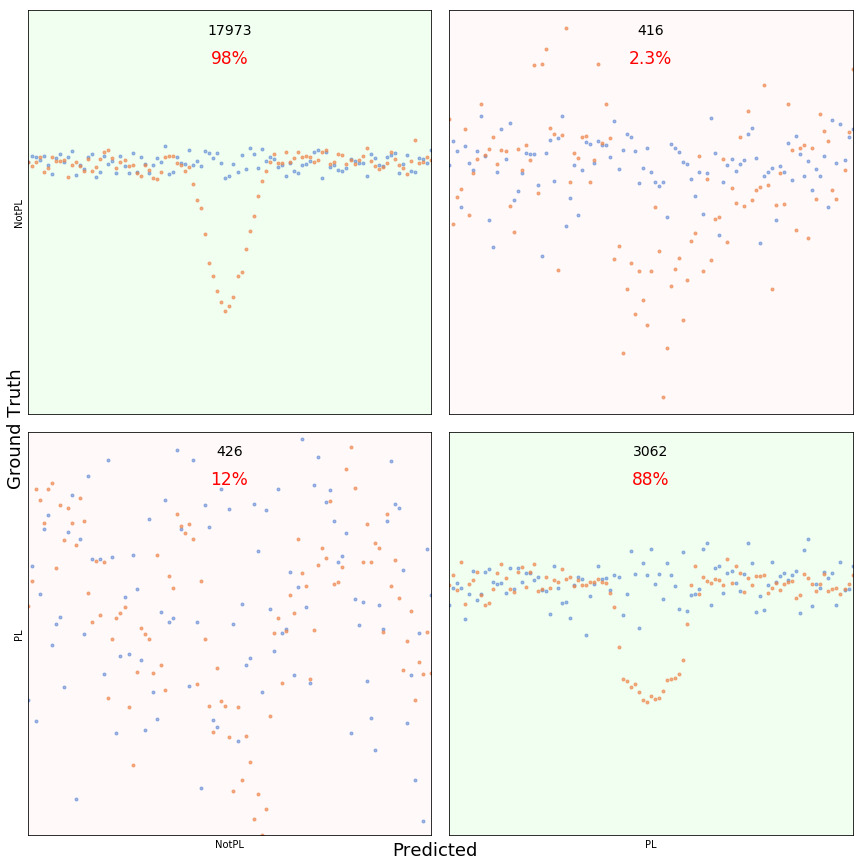

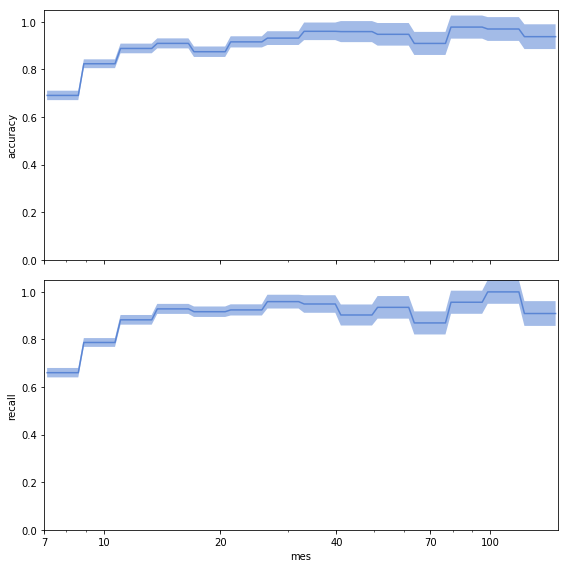

In [88]:
c2fold='/home/hosborn/TESS/final_runs/exonet_binary_CV_globcents3b_k8'
c2newoutputvals,c2all_dics=Assemble_dic(c2fold,use='tempdic',modeltype='binary')

c2labels=['UNK','PL']
for n in range(2):
    print(c2labels[n],'ACCURACY:',np.sum((c2all_dics['gt_val_final']==n)*((c2all_dics['pred_val_final']>0.5).astype(int)==n))/np.sum((c2all_dics['pred_val_final']>0.5).astype(int)==n),
          ' |  RECALL',np.sum((c2all_dics['gt_val_final']==n)*((c2all_dics['pred_val_final']>0.5).astype(int)==n))/np.sum(c2all_dics['gt_val_final']==n))

for how in [None,"micro","weighted","micro","macro","samples"]:
    print("average precision ",how," = ",average_precision_score(c2all_dics['gt_val_final'].astype(float), c2all_dics['pred_val_final'], average=how))

ModelProgress(c2newoutputvals,c2fold,modeltype='binary',lossy=None)
MakePR(c2all_dics,c2fold,modeltype='binary')
MakeConfMat(c2all_dics,c2fold,sourcedat='/home/hosborn/TESS/processed_dvpdc_101/',modeltype='binary',lc2plot='local')
c2outdf=MakeMESplotDic(c2all_dics,c2fold,by='snr',bins=None,nbins=15,modeltype='binary')
c2outdf,c2binarray=MakeMESplot(c2outdf,c2fold,by='mes',bins=None,nbins=15,modeltype='binary')


8
0
1
2
3
4
5
6
7
UNK ACCURACY: 0.9768465677482472  |  RECALL 0.9773777801946816
PL ACCURACY: 0.8803910293271996  |  RECALL 0.8778669724770642
average precision  None  =  0.9389878534807629
average precision  micro  =  0.9389878534807629
average precision  weighted  =  0.9389878534807629
average precision  micro  =  0.9389878534807629
average precision  macro  =  0.9389878534807629
average precision  samples  =  0.9389878534807629


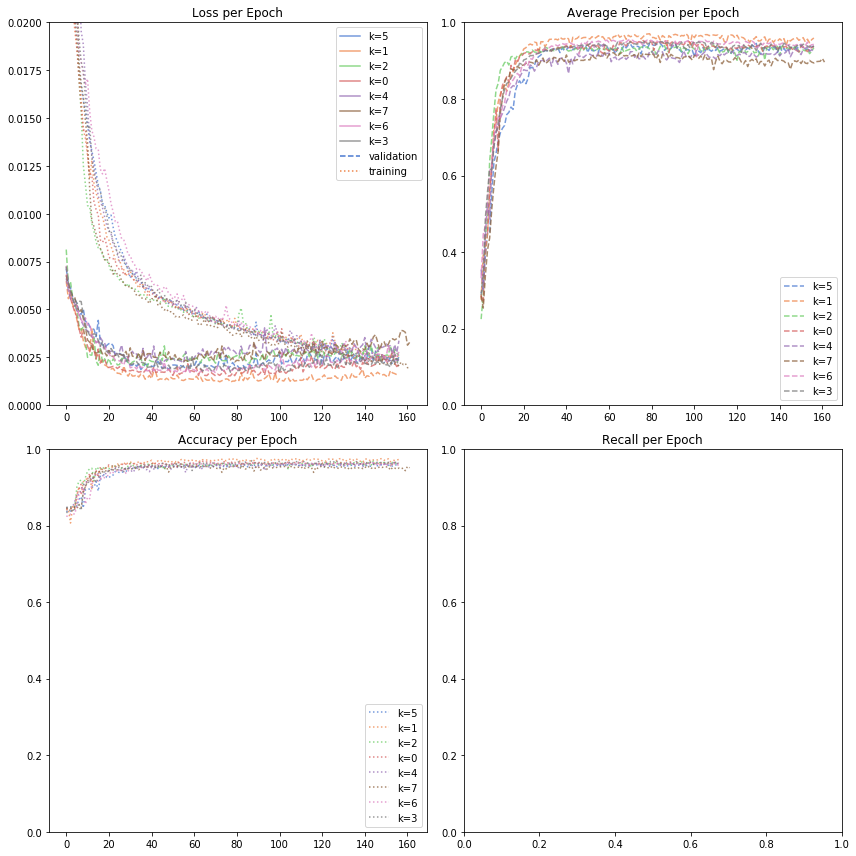

In [16]:
c2fold='/home/hosborn/TESS/final_runs/exonet_binary_CV_globcents3b_k8'
c2newoutputvals,c2all_dics=Assemble_dic(c2fold,use='tempdic',modeltype='binary')

c2labels=['UNK','PL']
for n in range(2):
    print(c2labels[n],'ACCURACY:',np.sum((c2all_dics['gt_val_final']==n)*((c2all_dics['pred_val_final']>0.5).astype(int)==n))/np.sum((c2all_dics['pred_val_final']>0.5).astype(int)==n),
          ' |  RECALL',np.sum((c2all_dics['gt_val_final']==n)*((c2all_dics['pred_val_final']>0.5).astype(int)==n))/np.sum(c2all_dics['gt_val_final']==n))

for how in [None,"micro","weighted","micro","macro","samples"]:
    print("average precision ",how," = ",average_precision_score(c2all_dics['gt_val_final'].astype(float), c2all_dics['pred_val_final'], average=how))

ModelProgress(c2newoutputvals,c2fold,modeltype='binary',lossy=[0.0,0.02])


8
0
1
2
3
4
5
6
7
UNK ACCURACY: 0.9753019552618751  |  RECALL 0.9792267116210778
PL ACCURACY: 0.888107791446983  |  RECALL 0.8692660550458715
average precision  None  =  0.9410410248371237
average precision  micro  =  0.9410410248371237
average precision  weighted  =  0.9410410248371237
average precision  micro  =  0.9410410248371237
average precision  macro  =  0.9410410248371237
average precision  samples  =  0.9410410248371237


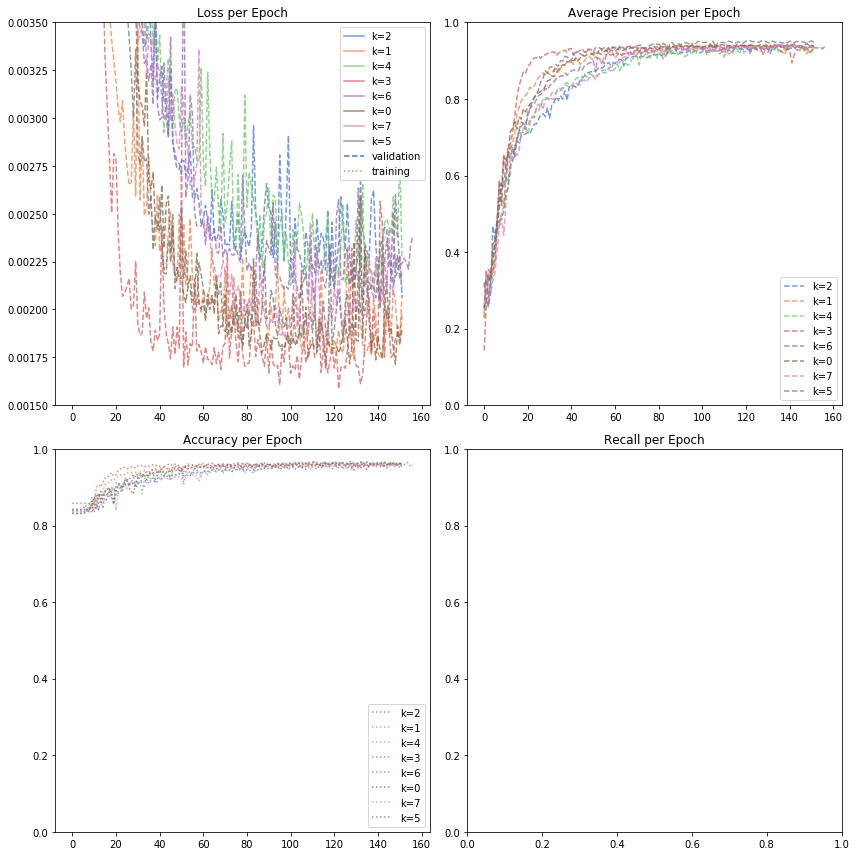

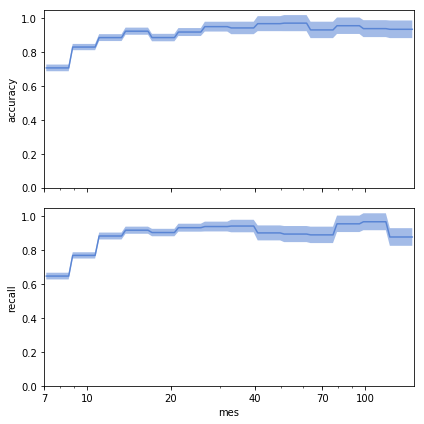

In [15]:
c2_2fold='/home/hosborn/TESS/final_runs/exonet_binary_CV_globcents3b_k8_2'
c2_2newoutputvals,c2_2all_dics=Assemble_dic(c2_2fold,use='tempdic',modeltype='binary')

c2_2labels=['UNK','PL']
for n in range(2):
    print(c2_2labels[n],'ACCURACY:',np.sum((c2_2all_dics['gt_val_final']==n)*((c2_2all_dics['pred_val_final']>0.5).astype(int)==n))/np.sum((c2_2all_dics['pred_val_final']>0.5).astype(int)==n),
          ' |  RECALL',np.sum((c2_2all_dics['gt_val_final']==n)*((c2_2all_dics['pred_val_final']>0.5).astype(int)==n))/np.sum(c2_2all_dics['gt_val_final']==n))

for how in [None,"micro","weighted","micro","macro","samples"]:
    print("average precision ",how," = ",average_precision_score(c2_2all_dics['gt_val_final'].astype(float), c2_2all_dics['pred_val_final'], average=how))

ModelProgress(c2_2newoutputvals,c2_2fold,modeltype='binary',lossy=[0.0015,0.0035])
c2_2outdf=MakeMESplotDic(c2_2all_dics,c2_2fold,by='snr',bins=None,nbins=15,modeltype='binary')
c2_2outdf,c2_2binarray=MakeMESplot(c2_2outdf,c2_2fold,by='mes',bins=None,nbins=15,modeltype='binary')


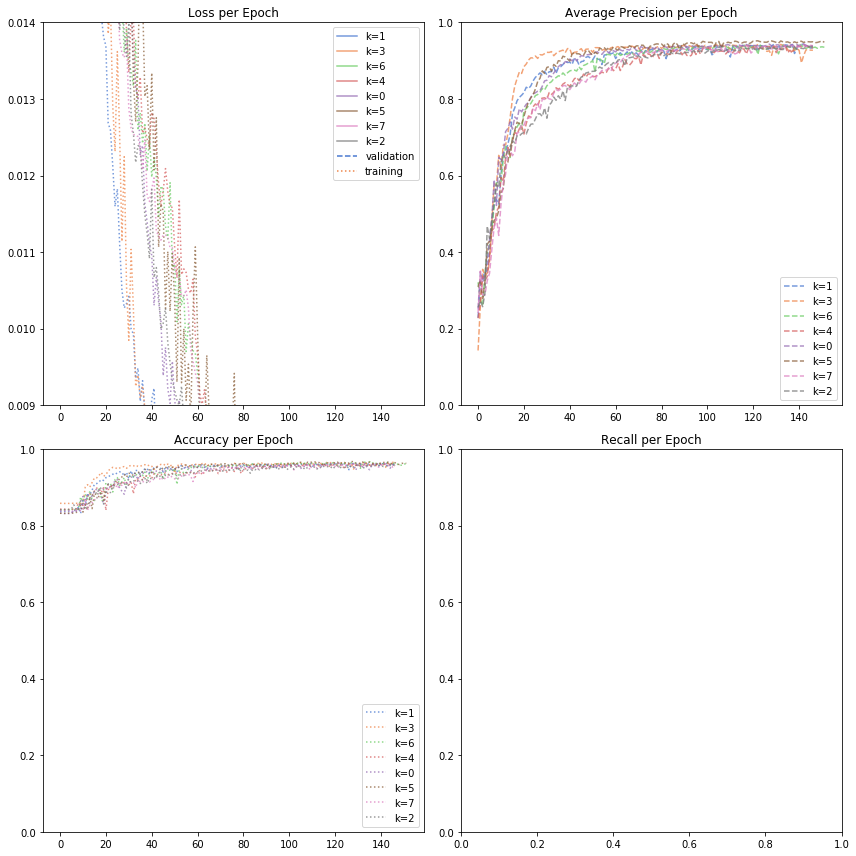

In [30]:
ModelProgress(c2_2newoutputvals,c2_2fold,modeltype='binary',lossy=None)

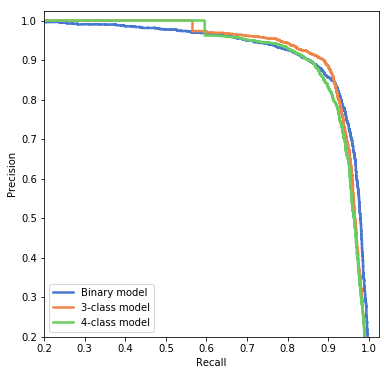

In [99]:
plt.figure(figsize=(6,6))

P, R, _ =precision_recall_curve(c2all_dics['gt_val_final'],c2all_dics['pred_val_final'])
plt.step(R, P,linewidth=2.5,label='Binary model')


P, R, _ =precision_recall_curve(c3one_hot_labels[:,1],c3all_dics['pred_val_final'][:,1])
plt.step(R, P,label='3-class model',linewidth=2.5)

P, R, _ =precision_recall_curve(c4one_hot_labels[:,1],c4all_dics['pred_val_final'][:,1])
plt.step(R, P,label='4-class model',linewidth=2.5)

#plt.plot([0,1],[1,0],linewidth=2.5,label='random')

plt.legend()
plt.xlim(0.2,1.025)
plt.ylim(0.2,1.025)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.savefig(path.join('/home/hosborn/TESS/PaperFigures/exonet_all_CV_globcents3b_k_AllPlanetPRComaparison.png'))
plt.savefig(path.join('/home/hosborn/TESS/PaperFigures/exonet_all_CV_globcents3b_k_AllPlanetPRComaparison.pdf'))

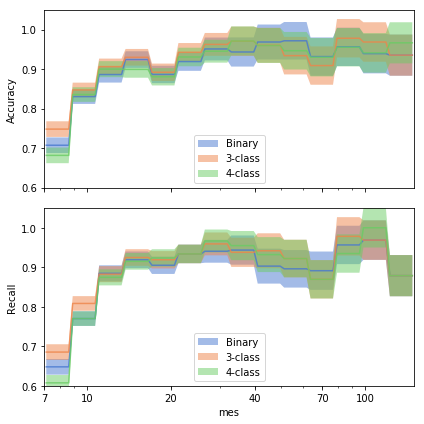

In [17]:
bins=np.logspace(np.log10(7),np.log10(150),15)
#Assembling MES from pickle dicts:
classes={'UNK':0,'PL':1,'EB':2,'BEB':3}
nlabel=0
by='mes'

plt.figure(figsize=(6,6))

array=np.zeros((len(bins),5))
for b in range(len(bins)-1):
    bbin=c2_2outdf.loc[(c2_2outdf[by].values>bins[b])*(c2_2outdf[by].values<=bins[b+1])]
    array[b,1]= np.sum((bbin.gt_class==1)*(bbin.pred_class==1))/np.sum(bbin.pred_class==1) # accuracy
    array[b,2]=1.0/np.sqrt(np.sum((c2_2outdf[by].values>bins[b])*(c2_2outdf[by].values<=bins[b+1]))) # poisson error
    array[b,3]= np.sum((bbin.gt_class==1)*(bbin.pred_class==1))/np.sum(bbin.gt_class==1)   # recall
    array[b,4]=1.0/np.sqrt(np.sum((c2_2outdf[by].values>bins[b])*(c2_2outdf[by].values<=bins[b+1]))) # poisson error
array[:,0]=bins
#array[:-1,0]+=0.5*np.diff(bins)
#arr_x=array
#Adding an extra row at the positive side of the bin with the same acc/recall
arr_x=np.vstack((np.column_stack((array[:-1,0]+np.diff(array[:,0])*0.075,array[:-1,1:])),np.column_stack((array[1:,0]-np.diff(array[:,0])*0.075,array[:-1,1:]))))
arr_x=arr_x[arr_x[:,0].argsort()]

plt.subplot(211)
filled=plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+1]-arr_x[:,nlabel*4+2], arr_x[:,nlabel*4+1]+arr_x[:,nlabel*4+2],alpha=0.5,linestyle='-',label='Binary',interpolate=True)
plt.plot(arr_x[:,0], arr_x[:,nlabel*4+1],alpha=0.8,color = filled.get_facecolor()[0])
#plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+1]-2*arr_x[:,nlabel*4+2], arr_x[:,nlabel*4+1]+2*arr_x[:,nlabel*4+2],alpha=0.25,linestyle='--',color = filled.get_facecolor())
plt.subplot(212)
filled2=plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+3]-arr_x[:,nlabel*4+4], arr_x[:,nlabel*4+3]+arr_x[:,nlabel*4+4],alpha=0.5,linestyle='-',label='Binary',interpolate=True)
plt.plot(arr_x[:,0], arr_x[:,nlabel*4+3],alpha=0.8,color = filled.get_facecolor()[0])
#plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+3]-2*arr_x[:,nlabel*4+4], arr_x[:,nlabel*4+3]+2*arr_x[:,nlabel*4+4],alpha=0.25,linestyle='--',color = filled2.get_facecolor(),label=labels[nlabel])

array=np.zeros((len(bins),5))
for b in range(len(bins)-1):
    bbin=c3outdf.loc[(c3outdf[by].values>bins[b])*(c3outdf[by].values<=bins[b+1])]
    array[b,1]= np.sum((bbin.gt_class==1)*(bbin.pred_class==1))/np.sum(bbin.pred_class==1) # accuracy
    array[b,2]=1.0/np.sqrt(np.sum((c3outdf[by].values>bins[b])*(c3outdf[by].values<=bins[b+1]))) # poisson error
    array[b,3]= np.sum((bbin.gt_class==1)*(bbin.pred_class==1))/np.sum(bbin.gt_class==1)   # recall
    array[b,4]=1.0/np.sqrt(np.sum((c3outdf[by].values>bins[b])*(c3outdf[by].values<=bins[b+1]))) # poisson error
array[:,0]=bins
#array[:-1,0]+=0.5*np.diff(bins)
#arr_x=array
#Adding an extra row at the positive side of the bin with the same acc/recall
arr_x=np.vstack((np.column_stack((array[:-1,0]+np.diff(array[:,0])*0.075,array[:-1,1:])),np.column_stack((array[1:,0]-np.diff(array[:,0])*0.075,array[:-1,1:]))))
arr_x=arr_x[arr_x[:,0].argsort()]

plt.subplot(211)
filled=plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+1]-arr_x[:,nlabel*4+2], arr_x[:,nlabel*4+1]+arr_x[:,nlabel*4+2],alpha=0.5,linestyle='-',label='3-class',interpolate=True)
plt.plot(arr_x[:,0], arr_x[:,nlabel*4+1],alpha=0.8,color = filled.get_facecolor()[0])
#plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+1]-2*arr_x[:,nlabel*4+2], arr_x[:,nlabel*4+1]+2*arr_x[:,nlabel*4+2],alpha=0.25,linestyle='--',color = filled.get_facecolor())
plt.subplot(212)
filled2=plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+3]-arr_x[:,nlabel*4+4], arr_x[:,nlabel*4+3]+arr_x[:,nlabel*4+4],alpha=0.5,linestyle='-',label='3-class',interpolate=True)
plt.plot(arr_x[:,0], arr_x[:,nlabel*4+3],alpha=0.8,color = filled.get_facecolor()[0])
#plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+3]-2*arr_x[:,nlabel*4+4], arr_x[:,nlabel*4+3]+2*arr_x[:,nlabel*4+4],alpha=0.25,linestyle='--',color = filled2.get_facecolor(),label=labels[nlabel])

array=np.zeros((len(bins),5))
for b in range(len(bins)-1):
    bbin=c4outdf.loc[(c4outdf[by].values>bins[b])*(c4outdf[by].values<=bins[b+1])]
    array[b,1]= np.sum((bbin.gt_class==1)*(bbin.pred_class==1))/np.sum(bbin.pred_class==1) # accuracy
    array[b,2]=1.0/np.sqrt(np.sum((c4outdf[by].values>bins[b])*(c4outdf[by].values<=bins[b+1]))) # poisson error
    array[b,3]= np.sum((bbin.gt_class==1)*(bbin.pred_class==1))/np.sum(bbin.gt_class==1)   # recall
    array[b,4]=1.0/np.sqrt(np.sum((c4outdf[by].values>bins[b])*(c4outdf[by].values<=bins[b+1]))) # poisson error
array[:,0]=bins
#array[:-1,0]+=0.5*np.diff(bins)
#arr_x=array
#Adding an extra row at the positive side of the bin with the same acc/recall
arr_x=np.vstack((np.column_stack((array[:-1,0]+np.diff(array[:,0])*0.075,array[:-1,1:])),np.column_stack((array[1:,0]-np.diff(array[:,0])*0.075,array[:-1,1:]))))
arr_x=arr_x[arr_x[:,0].argsort()]

plt.subplot(211)
filled=plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+1]-arr_x[:,nlabel*4+2], arr_x[:,nlabel*4+1]+arr_x[:,nlabel*4+2],alpha=0.5,linestyle='-',label='4-class',interpolate=True)
plt.plot(arr_x[:,0], arr_x[:,nlabel*4+1],alpha=0.8,color = filled.get_facecolor()[0])
#plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+1]-2*arr_x[:,nlabel*4+2], arr_x[:,nlabel*4+1]+2*arr_x[:,nlabel*4+2],alpha=0.25,linestyle='--',color = filled.get_facecolor())
plt.subplot(212)
filled2=plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+3]-arr_x[:,nlabel*4+4], arr_x[:,nlabel*4+3]+arr_x[:,nlabel*4+4],alpha=0.5,linestyle='-',label='4-class',interpolate=True)
plt.plot(arr_x[:,0], arr_x[:,nlabel*4+3],alpha=0.8,color = filled.get_facecolor()[0])
#plt.fill_between(arr_x[:,0], arr_x[:,nlabel*4+3]-2*arr_x[:,nlabel*4+4], arr_x[:,nlabel*4+3]+2*arr_x[:,nlabel*4+4],alpha=0.25,linestyle='--',color = filled2.get_facecolor(),label=labels[nlabel])

plt.subplot(211)
plt.legend(loc=8)
plt.subplot(212)
plt.legend(loc=8)

plt.subplot(211)
plt.ylabel('Accuracy')
plt.xscale('log')
plt.xlim(bins[0],bins[-1])
plt.gca().set_xticks([7, 10, 20, 40, 70, 100])
plt.gca().set_xticklabels([])
plt.ylim(0.6,1.05)

plt.subplot(212)
plt.ylabel('Recall')
plt.xlabel(by)
plt.ylim(0.6,1.05)

plt.xscale('log')
plt.xlim(bins[0],bins[-1])
plt.gca().set_xticks([7, 10, 20, 40, 70, 100])
plt.gca().set_xticklabels(["7", "10", "20", "40", "70", "100"])

plt.ylim(0.6,1.05)

plt.tight_layout()

plt.savefig(path.join('/home/hosborn/TESS/PaperFigures/exonet_all_CV_globcents3b_k_AllPlanetMESComaparison.png'))
plt.savefig(path.join('/home/hosborn/TESS/PaperFigures/exonet_all_CV_globcents3b_k_AllPlanetMESComaparison.pdf'))

In [49]:
c4outdf.loc[(c4outdf[by].values>bins[b])*(c4outdf[by].values<=bins[b+1])].pred_class

000031814405_08_04    2.0
000033444442_01_04    3.0
000038583537_00_01    0.0
000038827449_06_04    3.0
000038828272_02_99    2.0
000050344368_03_99    2.0
000053951347_03_02    0.0
000066399111_03_03    3.0
000067582908_00_04    0.0
000100667275_00_01    2.0
000111223102_00_03    3.0
000137798264_00_03    0.0
000139322703_03_99    3.0
000143663948_00_01    2.0
000149988523_02_02    1.0
000152966803_00_04    3.0
000166711072_02_04    3.0
000167164775_05_99    3.0
000167753454_03_02    3.0
000167753454_08_03    3.0
000167753454_09_04    3.0
000197867011_01_04    0.0
000207108949_02_03    2.0
000207108949_05_04    2.0
000207109184_05_99    2.0
000220476607_05_03    0.0
000229097168_10_04    2.0
000229159785_04_99    1.0
000237937517_01_99    3.0
000237939392_03_02    1.0
                     ... 
000231833061_16_99    3.0
000254278612_00_01    3.0
000259902846_01_03    1.0
000260502312_00_01    3.0
000262923236_00_99    3.0
000268536921_01_04    3.0
000279370402_07_04    3.0
000287273024

In [54]:
bins

array([  7.        ,   8.71302548,  10.84525901,  13.4992883 ,
        16.80280614,  20.91475402,  26.03296925,  32.40370349,
        40.33347061,  50.20379389,  62.48956222,  77.7818783 ,
        96.81649825, 120.50923092, 150.        ])

In [53]:

for b in range(len(bins)-1):
    bbin=c4outdf.loc[(c4outdf[by].values>bins[b])*(c4outdf[by].values<=bins[b+1])]
    print(b,np.sum((bbin.gt_class==1)*(bbin.pred_class==1))/np.sum(bbin.pred_class==1))
    #array[b,2]=1.0/np.sqrt(np.sum((c4outdf[by].values>bins[b])*(c4outdf[by].values<=bins[b+1]))) # poisson error
    print(b,np.sum((bbin.gt_class==1)*(bbin.pred_class==1))/np.sum(bbin.gt_class==1))
    #array[b,4]=1.0/np.sqrt(np.sum((c4outdf[by].values>bins[b])*(c4outdf[by].values<=bins[b+1]))) # poisson error


0 0.6818181818181818
0 0.6074766355140186
1 0.8357588357588358
1 0.7701149425287356
2 0.9
2 0.8744939271255061
3 0.8994307400379506
3 0.915057915057915
4 0.8807947019867549
4 0.9236111111111112
5 0.9308176100628931
5 0.9337539432176656
6 0.9454545454545454
6 0.966542750929368
7 0.9712643678160919
7 0.9548022598870056
8 0.96
8 0.9320388349514563
9 0.9466666666666667
9 0.922077922077922
10 0.9302325581395349
10 0.8695652173913043
11 0.9555555555555556
11 0.9347826086956522
12 0.9411764705882353
12 1.0
13 0.9666666666666667
13 0.8787878787878788


UNK acc 0 0.9192015209125475
UNK rec 0 0.9536489151873767
UNK acc 1 0.9273743016759777
UNK rec 1 0.9563130100816131
UNK acc 2 0.937769562538509
UNK rec 2 0.9554300062774639
UNK acc 3 0.9510591672753835
UNK rec 3 0.9469090909090909
UNK acc 4 0.9583975346687211
UNK rec 4 0.9467275494672754
UNK acc 5 0.9670608108108109
UNK rec 5 0.9638047138047138
UNK acc 6 0.9751552795031055
UNK rec 6 0.9617151607963247
UNK acc 7 0.9452554744525548
UNK rec 7 0.9350180505415162
UNK acc 8 0.9299363057324841
UNK rec 8 0.9358974358974359
UNK acc 9 0.9292929292929293
UNK rec 9 0.8214285714285714
UNK acc 10 0.8070175438596491
UNK rec 10 0.6865671641791045
UNK acc 11 0.9
UNK rec 11 0.8059701492537313
UNK acc 12 0.9615384615384616
UNK rec 12 0.819672131147541
UNK acc 13 0.8909090909090909
UNK rec 13 0.8305084745762712
PL acc 0 0.6818181818181818
PL rec 0 0.6074766355140186
PL acc 1 0.8357588357588358
PL rec 1 0.7701149425287356
PL acc 2 0.9
PL rec 2 0.8744939271255061
PL acc 3 0.8994307400379506
PL rec 3 0.91505

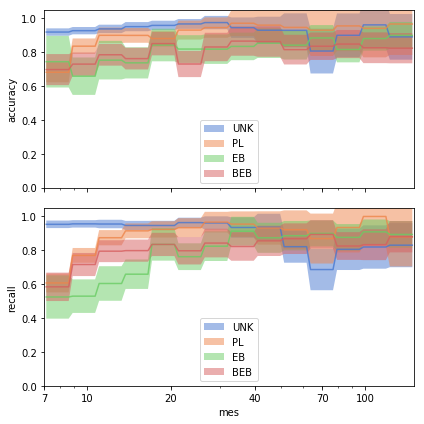

In [59]:
c4outdf,c4binarray=MakeMESplot(c4outdf,c4fold,by='mes',bins=None,nbins=15,modeltype='4class')

IndexError: index 5 is out of bounds for axis 1 with size 5

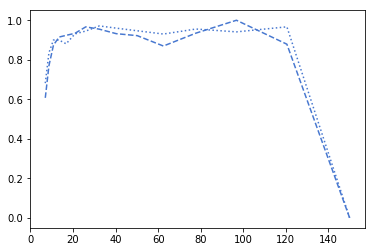

In [37]:
for n in range(1,15,4):
    line=plt.plot(array[:,0],array[:,n],':')
    plt.plot(array[:,0],array[:,n+2],'--',color=line[0].get_color())

In [32]:
len(c4binarray[0])

17

In [208]:
unks_poss_pls=c3all_dics['val_files'][(np.argmax(c3all_dics['pred_val_final'],axis=1)==1)*(c3all_dics['gt_val_final']==0)]
unks_poss_ebs=c3all_dics['val_files'][(np.argmax(c3all_dics['pred_val_final'],axis=1)==2)*(c3all_dics['gt_val_final']==0)]

In [281]:
filelist=unks_poss_pls
arr=np.column_stack((filelist,np.array([f.split('/')[-1][:-10] for f in filelist])))
arr=np.column_stack((arr,np.vstack([f.split('_') for f in arr[:,1]])))

tid_dics={n:np.genfromtxt('/mnt/disks/tessdata/injdata/sector-'+str(n)+'_dips_inj_index.txt') for n in range(1,5)}

detdic={}
injinds=[]
for nrow in range(len(arr)):
    sect=int(arr[nrow,4])
    if sect==99:
        sects=[1,2,3,4]
    else:
        sects=[sect]
    for s in sects:
        if float(arr[nrow,2]) in tid_dics[s]:
            injinds+=[[arr[nrow,1],s,list(tid_dics[s]).index(float(arr[nrow,2]))]]
    detdic[arr[nrow,1]]=[np.load(arr[nrow,0].replace('_info2','_loc')),np.load(arr[nrow,0].replace('_info2','_glob'))]
injinds=np.vstack(injinds)

In [287]:
injinds

array([['000006671953_01_01', '1', '30'],
       ['000025196356_08_02', '2', '10076'],
       ['000029433169_00_02', '2', '2447'],
       ...,
       ['000425997655_03_02', '2', '11497'],
       ['000464651598_00_01', '1', '4023'],
       ['000466260839_00_01', '1', '5728']], dtype='<U18')

In [320]:
varinjdic={}
dipinjdic={}

for s in range(1,5):
    print("getting dips from s="+str(s))
    with open('/mnt/disks/tessdata/injdata/sector-'+str(int(s))+'_dips_inj.csv') as fp:
        for i, line1 in enumerate(fp):
            if i in injinds[injinds[:,1].astype(int)==s,2].astype(int):
                ix=injinds[(injinds[:,1].astype(int)==s)*(injinds[:,2].astype(int)==i),0][0]
                #print(i,' = ',ix)
                if ix not in dipinjdic.keys():
                    dipinjdic[ix]=line1.replace('\n','').split(',')
                else:
                    dipinjdic[ix]=dipinjdic[ix]+line1.split(',')
    print("getting var from s="+str(s))
    with open('/mnt/disks/tessdata/injdata/sector-'+str(int(s))+'_variability_inj.csv') as fp:
        for i2, line2 in enumerate(fp):
            if i2 in injinds[injinds[:,1].astype(int)==s,2].astype(int):
                ix=injinds[(injinds[:,1].astype(int)==s)*(injinds[:,2].astype(int)==i2),0][0]
                if ix not in varinjdic.keys():
                    varinjdic[ix]=line2.replace('\n','').split(',')
                else:
                    varinjdic[ix]=varinjdic[ix]+line2.split(',')

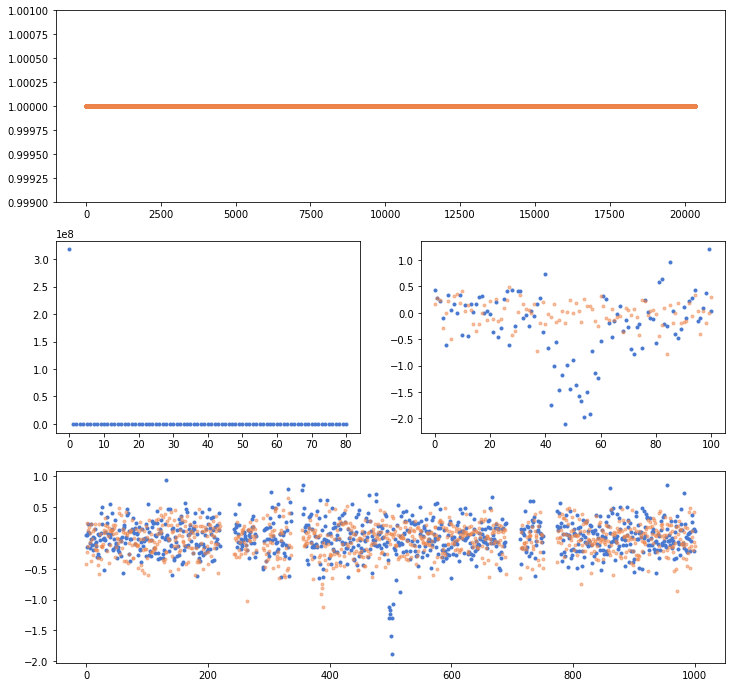

In [352]:
plt.figure(figsize=(12,12))
for k in list(varinjdic.keys()):
    plt.clf()
    plt.subplot(311)
    var=np.array(varinjdic[k][:-1]).astype(float)
    dip=np.array(dipinjdic[k][:-1]).astype(float)
    var/=np.nanmedian(var)
    dip/=np.nanmedian(dip)
    plt.plot(var,'.')
    plt.plot(dip,'.')
    lims=np.vstack((np.percentile(dip,[0.05,99.99]),np.percentile(var,[0.05,99.95])))
    plt.ylim(np.min(lims[:,0]),np.max(lims[:,1]))
    plt.subplot(323)
    minpnt=np.argmin(dip)
    plt.plot(dip[int(np.clip(minpnt-80,0,1e8)):int(np.clip(minpnt+80,0,len(dip)))],'.')
    plt.subplot(324)
    plt.plot(detdic[k][0][:,0],'.')
    plt.plot(detdic[k][0][:,1],'.',alpha=0.5)
    plt.subplot(313)
    plt.plot(detdic[k][1][:,0],'.')
    plt.plot(detdic[k][1][:,1],'.',alpha=0.5)
    plt.savefig('/home/hosborn/TESS/PaperFigures/Unknowns/PL_'+k+'.png')

In [360]:
np.min(np.array(varinjdic2['000025116423_01_01']).astype(float)[1:])

1.0

In [ ]:
'000029832209_04_99'

In [353]:
arr2=np.column_stack((unks_poss_ebs,np.array([f.split('/')[-1][:-10] for f in unks_poss_ebs])))
arr2=np.column_stack((arr2,np.vstack([f.split('_') for f in arr2[:,1]])))

tid_dics={n:np.genfromtxt('/mnt/disks/tessdata/injdata/sector-'+str(n)+'_dips_inj_index.txt') for n in range(1,5)}

varinjdic2={}
dipinjdic2={}
detdic2={}
injinds2=[]
for nrow in range(len(arr2)):
    sect=int(arr2[nrow,4])
    if sect==99:
        sects=[1,2,3,4]
    else:
        sects=[sect]
    
    for s in sects:
        if float(arr2[nrow,2]) in tid_dics[s]:
            injinds2+=[[arr2[nrow,1],s,list(tid_dics[s]).index(float(arr2[nrow,2]))]]
    detdic2[arr2[nrow,1]]=[np.load(arr2[nrow,0].replace('_info2','_loc')),np.load(arr2[nrow,0].replace('_info2','_glob'))]
    
injinds2=np.vstack(injinds2)
for s in range(1,5):
    print("getting dips from s="+str(s))
    with open('/mnt/disks/tessdata/injdata/sector-'+str(int(s))+'_dips_inj.csv') as fp:
        for i, line1 in enumerate(fp):
            if i in injinds2[injinds2[:,1].astype(int)==s,2].astype(int):
                ix=injinds2[(injinds2[:,1].astype(int)==s)*(injinds2[:,2].astype(int)==i),0][0]
                if ix not in dipinjdic2.keys():
                    dipinjdic2[ix]=line1.replace('\n','').split(',')
                else:
                    dipinjdic2[ix]=dipinjdic2[ix]+line1.split(',')
    print("getting var from s="+str(s))
    with open('/mnt/disks/tessdata/injdata/sector-'+str(int(s))+'_variability_inj.csv') as fp:
        for i2, line2 in enumerate(fp):
            if i2 in injinds2[injinds2[:,1].astype(int)==s,2].astype(int):
                ix=injinds2[(injinds2[:,1].astype(int)==s)*(injinds2[:,2].astype(int)==i2),0][0]
                if ix not in varinjdic2.keys():
                    varinjdic2[ix]=line2.replace('\n','').split(',')
                else:
                    varinjdic2[ix]=varinjdic2[ix]+line2.split(',')


getting dips from s=1
getting var from s=1
getting dips from s=2
getting var from s=2
getting dips from s=3
getting var from s=3
getting dips from s=4
getting var from s=4


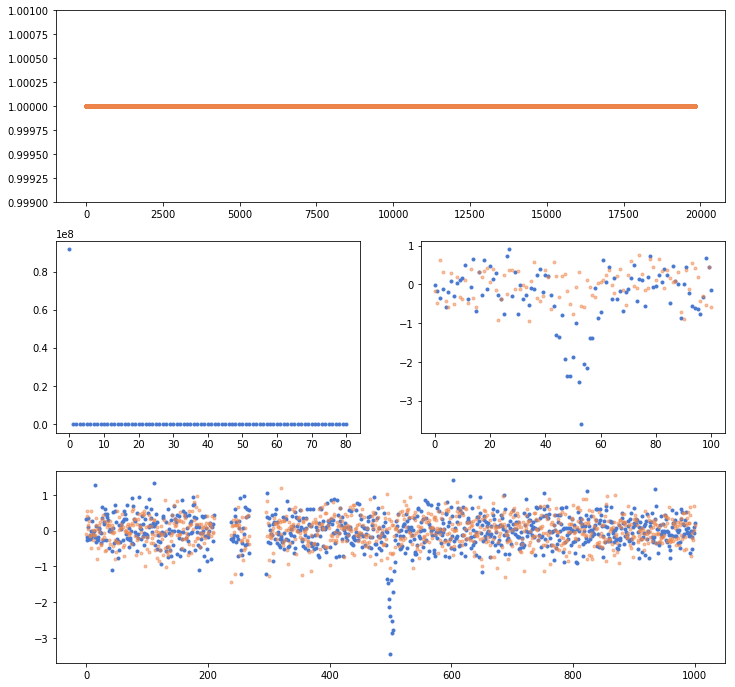

In [354]:
plt.figure(figsize=(12,12))
for k in list(varinjdic2.keys()):
    plt.clf()
    plt.subplot(311)
    var=np.array(varinjdic2[k][:-1]).astype(float)
    dip=np.array(dipinjdic2[k][:-1]).astype(float)
    var/=np.nanmedian(var)
    dip/=np.nanmedian(dip)
    plt.plot(var,'.')
    plt.plot(dip,'.')
    lims=np.vstack((np.percentile(dip,[0.05,99.99]),np.percentile(var,[0.05,99.95])))
    plt.ylim(np.min(lims[:,0]),np.max(lims[:,1]))
    plt.subplot(323)
    minpnt=np.argmin(dip)
    plt.plot(dip[int(np.clip(minpnt-80,0,1e8)):int(np.clip(minpnt+80,0,len(dip)))],'.')
    plt.subplot(324)
    plt.plot(detdic2[k][0][:,0],'.')
    plt.plot(detdic2[k][0][:,1],'.',alpha=0.5)
    plt.subplot(313)
    plt.plot(detdic2[k][1][:,0],'.')
    plt.plot(detdic2[k][1][:,1],'.',alpha=0.5)
    plt.savefig('/home/hosborn/TESS/PaperFigures/Unknowns/EB_'+k+'.png')

In [328]:
np.array(varinjdic[k][:-1]).astype(float)

array([1.40828333e+08, 1.00012140e+00, 1.00010000e+00, ...,
       9.99824400e-01, 9.99874500e-01, 9.99939260e-01])

In [346]:
np.all(dip==var)

True

In [348]:
np.max(lims[:,1])

1.001923315

In [324]:
varinjdic.keys()

dict_keys(['000140828663_05_03', '000030468581_00_01', '000031694957_00_01', '000149497674_05_02', '000344333357_01_04', '000177080894_01_02', '000323292655_00_01', '000031782222_09_99', '000309698515_10_99', '000219308560_05_99', '000166680879_10_99', '000024704862_09_02', '000179639063_00_99', '000040719527_01_03', '000149120706_05_03', '000158235938_00_01', '000382190757_01_01', '000246821124_00_03', '000278772999_00_02', '000405425498_02_99', '000260889990_00_02', '000382419401_00_03', '000234510669_01_02', '000293224564_03_02', '000281727553_01_99', '000293162780_00_99', '000370038084_06_03', '000142107922_00_01', '000382160166_03_03', '000340783389_00_04', '000067567387_00_04', '000406403791_00_03', '000259701242_02_04', '000024695570_00_03', '000101654100_01_01', '000431479938_01_01', '000128727498_01_01', '000270245797_02_01', '000381950979_05_03', '000319560206_01_03', '000293269165_02_01', '000271797685_00_02', '000244203387_05_04', '000158624501_00_03', '000038828707_00_02',

In [296]:
dipinjdic.keys()

dict_keys([])

In [ ]:
plt.figure(figsize=(12,12))
for k in injdic2:
    plt.subplot(311)
    plt.plot(injdic2[k][0]/np.nanmedian(injdic2[k][0]),'.')
    plt.plot(injdic2[k][1]/np.nanmedian(injdic2[k][1]),'.')
    plt.subplot(323)
    minpnt=np.argmin(injdic2[k][0])
    plt.plot(injdic2[k][0,np.clip(minpnt-80,0,1e8):np.clip(minpnt+80,0,len(injdic2[k][0]))],'.')
    plt.subplot(324)
    plt.plot(detdic2[k][0],'.')
    plt.subplot(313)
    plt.plot(detdic2[k][1],'.')
    plt.savefig('Unknowns/EB_'+k+'.png')

In [271]:
a=[]
a+=[4,6,78,2]
a+=['thjat',5,2,1]

In [272]:
a

[4, 6, 78, 2, 'thjat', 5, 2, 1]

In [264]:
float(arr[nrow,2]) in tid_dics[s]

True

In [244]:
csv=pd.DataFrame.from_csv('/mnt/disks/tessdata/injdata/all_injs_sector-'+str(int(s))+'_df.csv')
len(csv.index.values)

/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:1: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  """Entry point for launching an IPython kernel.


22295

In [245]:
len(np.unique(csv.index.values))

22055

In [240]:
np.in1d(csv.index.values,arr[:,2].astype(float))

22295

In [238]:
len(arr)

284

In [233]:
s=1
csv=pd.DataFrame.from_csv

/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:2: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  


In [237]:
csv.shape

(22295, 52)

In [ ]:
lines=[25, 29]
i=0
f=open('filename')
for line in f:
    if i in lines:
        print i
    i+=1

In [225]:
len(np.in1d(csv.index,arr[:,2].astype(float)))

1

In [232]:
arr[:,2].astype(float)

array([6.67195300e+06, 2.51963560e+07, 2.94331690e+07, 3.16374790e+07,
       3.88287070e+07, 5.03166330e+07, 5.54014880e+07, 1.12243062e+08,
       1.26821282e+08, 1.28727498e+08, 1.39258210e+08, 1.39349894e+08,
       1.39990402e+08, 1.44387278e+08, 1.58517957e+08, 1.67721057e+08,
       1.79639063e+08, 2.01884595e+08, 2.20414682e+08, 2.34498721e+08,
       2.34510669e+08, 2.38852320e+08, 2.44203387e+08, 2.60003879e+08,
       2.60076490e+08, 2.60659374e+08, 2.60967812e+08, 2.60967812e+08,
       2.66969794e+08, 2.68633434e+08, 2.69829751e+08, 2.78772999e+08,
       3.00136653e+08, 3.04134473e+08, 3.09698515e+08, 3.19560206e+08,
       3.48898031e+08, 3.49371685e+08, 3.70009865e+08, 3.82419401e+08,
       3.82572066e+08, 3.94134281e+08, 1.30991480e+07, 2.98258520e+07,
       3.01946480e+07, 3.11779720e+07, 3.13836490e+07, 3.18699940e+07,
       3.38387770e+07, 3.86360370e+07, 1.49120706e+08, 1.49497674e+08,
       1.58624501e+08, 1.60083895e+08, 1.66680879e+08, 1.77180032e+08,
      

In [ ]:
n=0

In [ ]:
plt.figure(figsize=(12,9))
loc=np.load(arr[n,0].replace('_info2','loc'))
glob=np.load(arr[n,0].replace('_info2','glob'))
plt.subplot(211)
plt.plot(loc)
plt.subplot(212)
plt.plot(glob)
if arr[n,2] in csvs.index.data
n+=1

In [217]:
csvtest=pd.DataFrame.from_csv('/mnt/disks/tessdata/injdata/all_injs_sector-4_df.csv')

/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:1: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  """Entry point for launching an IPython kernel.


In [218]:
csvtest

,TID,absoluteFluxMedian,argumentOfPeriastron,btjdTimestamps,contactModulationDepthPpm,decDegrees,defaultAlbedo,defaultEffectiveTempKelvin,duration,eccentricity,...,sector,semiMajorAxisAu,transitDepthPpm,transitDepthPpmErr,transitDurationHours,transitDurationHoursErr,transitEpochBtjd,transitEpochBtjdErr,transitIngressTimeHours,type
1.076222e+08,10762219.0,NaN,NaN,[1395.806054 1395.80744288 1395.80883176 ......,NaN,NaN,0.3,5780.0,NaN,NaN,...,sector-4,0.430914,853.984326,NaN,2.389429,NaN,1014.541827,NaN,0.560803,PL
1.076222e+08,10762219.0,NaN,NaN,[1395.806054 1395.80744288 1395.80883176 ......,NaN,NaN,0.3,5780.0,NaN,NaN,...,sector-4,0.052918,1541.682208,NaN,1.340177,NaN,1000.227892,NaN,0.106654,PL
1.076263e+08,10762631.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.534645,NaN,...,sector-4,NaN,763.688643,inf,36.831481,18.415741,13.948572,0.767323,NaN,VAR
1.076273e+08,10762725.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.201027,NaN,...,sector-4,NaN,768.621312,0.000002,28.824638,14.412319,8.170871,0.600513,NaN,VAR
1.076382e+08,10763822.0,NaN,NaN,[1395.80609991 1395.80748879 1395.80887767 ......,NaN,NaN,0.3,5780.0,NaN,NaN,...,sector-4,0.197387,1158.820447,NaN,3.017624,NaN,1007.470933,NaN,0.481678,PL
1.076382e+08,10763822.0,NaN,NaN,[1395.80609991 1395.80748879 1395.80887767 ......,NaN,NaN,0.3,5780.0,NaN,NaN,...,sector-4,0.643633,2202.043202,NaN,8.521681,NaN,1160.963442,NaN,0.620631,PL
1.076382e+08,10763822.0,NaN,NaN,[1395.80609991 1395.80748879 1395.80887767 ......,NaN,NaN,0.3,5780.0,NaN,NaN,...,sector-4,0.313507,895.700046,NaN,2.606220,NaN,1003.782758,NaN,0.890515,PL
1.078452e+08,10784515.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.726476,NaN,...,sector-4,NaN,30870.906224,inf,41.435417,20.717708,15.692775,0.863238,NaN,VAR
1.078482e+07,10784824.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,sector-4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NONE
1.078492e+08,10784919.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.863238,NaN,...,sector-4,NaN,571.555145,inf,20.717708,10.358854,7.846387,0.431619,NaN,VAR


In [ ]:
158517957 in csvtest.index.values

In [202]:
fold='/home/hosborn/TESS/new_runs/exonet_binary_CV_wfixedcent'
newoutputvals,all_dics=Assemble_dic(fold,use='other')

8
0
cannot process
1
2
3
4
cannot process
5
6
7


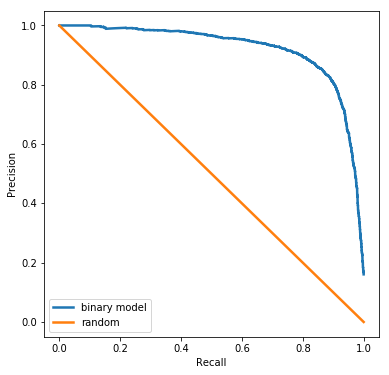

In [174]:
MakePR(all_dics,fold)

/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:20: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


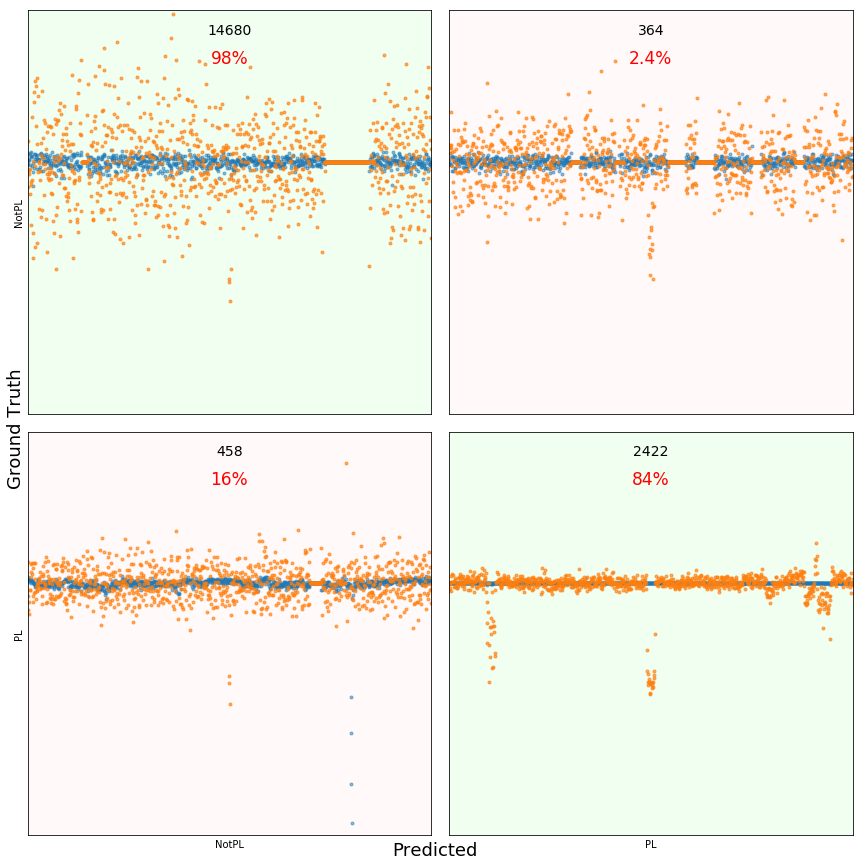

In [175]:
MakeConfMat(all_dics,fold,sourcedat='/home/hosborn/TESS/processed_dv_101_centfixed/',modeltype='binary',lc2plot='global')

8
0
1
2
3
4
5
6
7


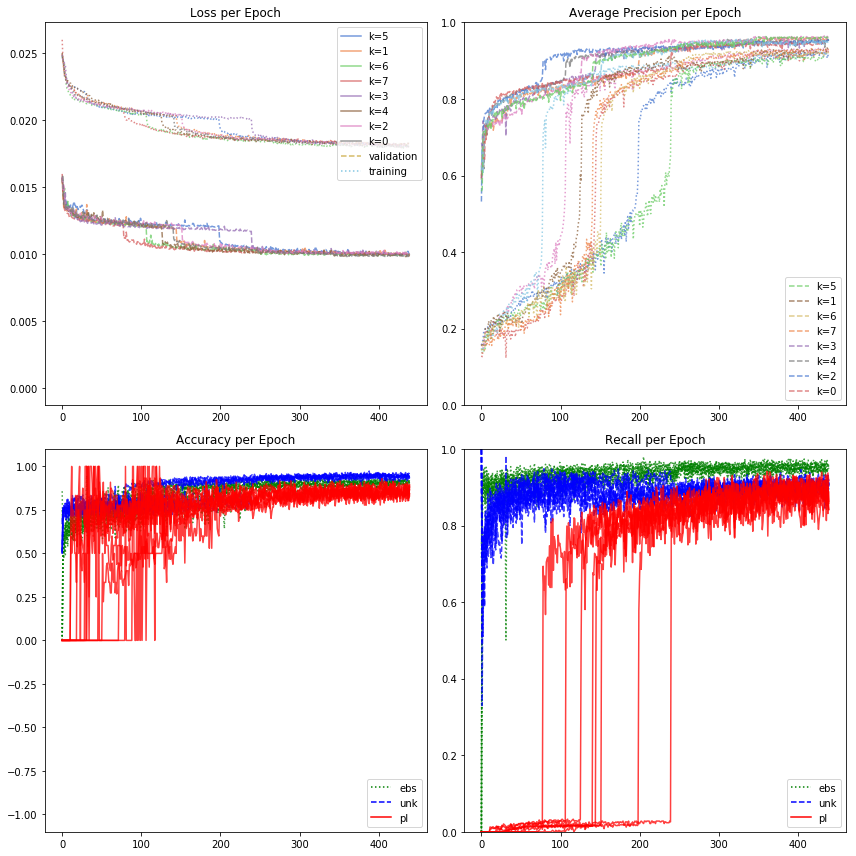

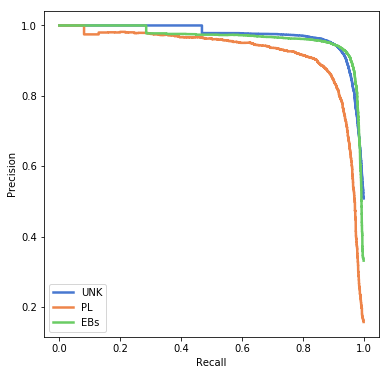

In [57]:
fold='/home/hosborn/TESS/new_runs/exonet_multiclass3_CV_wfixedcent_cont/'
newoutputvals,all_dics=Assemble_dic(fold,modeltype='3class')
ModelProgress(newoutputvals,fold,modeltype='3class')
MakePR(all_dics,fold,modeltype='3class')

/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:20: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


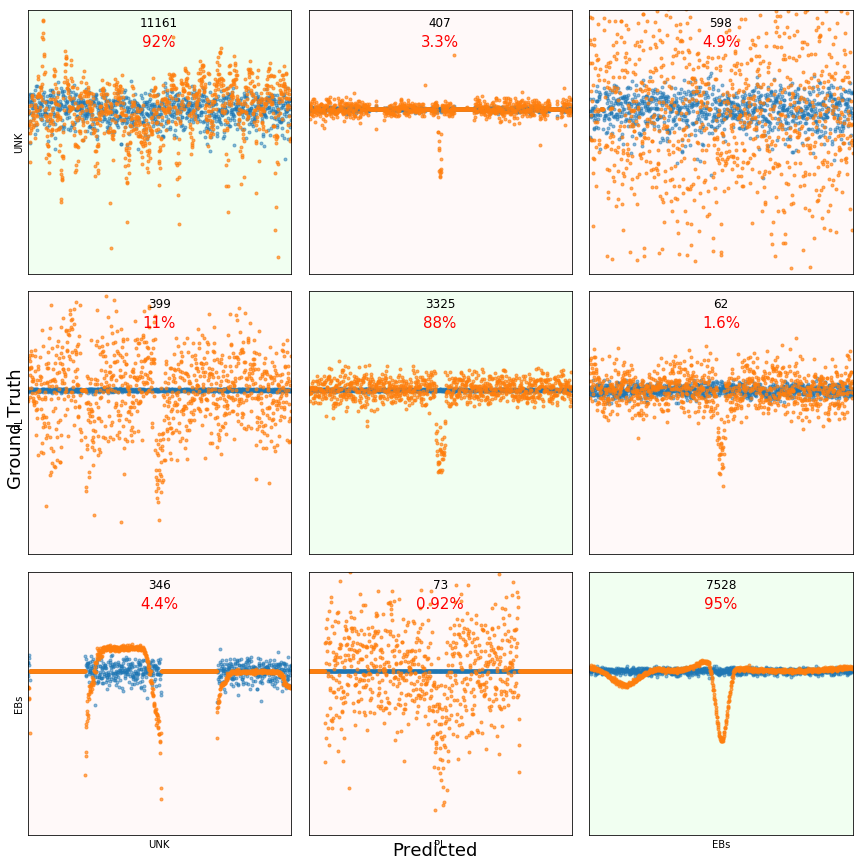

In [177]:
MakeConfMat(all_dics,fold,sourcedat='/home/hosborn/TESS/processed_dv_101_centfixed/',modeltype='3class',lc2plot='global')

8
0
1
2
3
4
5
6
7


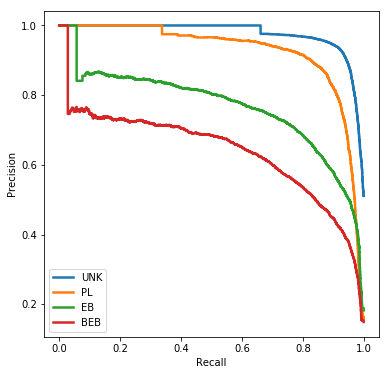

In [178]:
fold='/home/hosborn/TESS/new_runs/exonet_multiclass_CV_wfixedcent_cont/'
newoutputvals,all_dics=Assemble_dic(fold,modeltype='4class')
MakePR(all_dics,fold,modeltype='4class')

/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:20: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


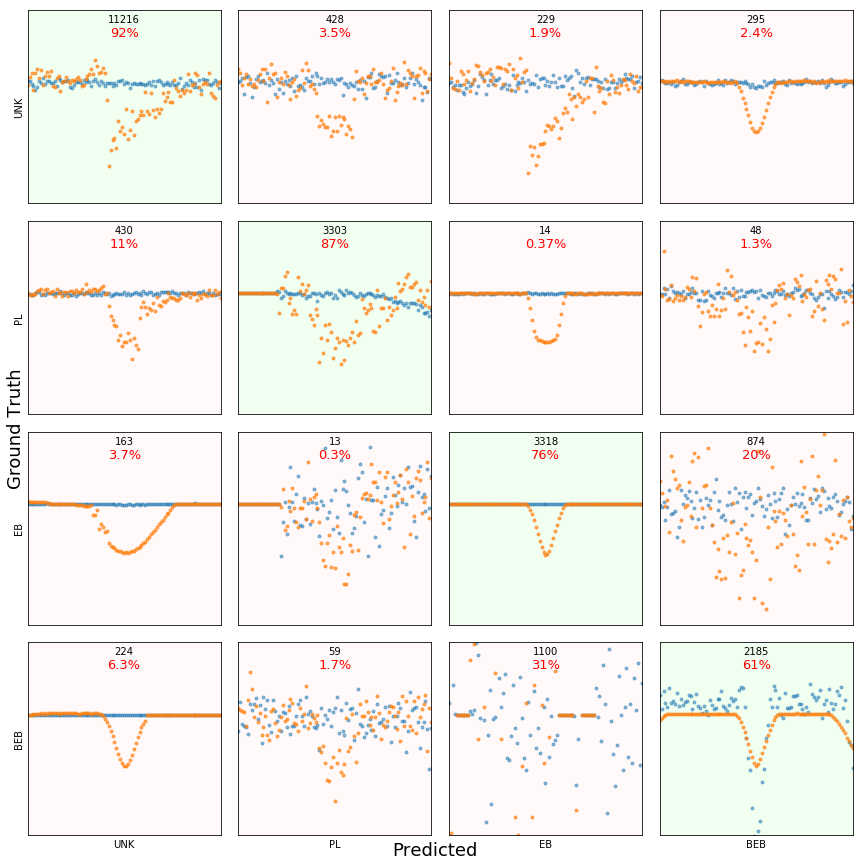

In [179]:
MakeConfMat(all_dics,fold,sourcedat='/home/hosborn/TESS/processed_dv_101_centfixed/',modeltype='4class',lc2plot='local')

6
0
1
2
3
4
5


/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:20: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


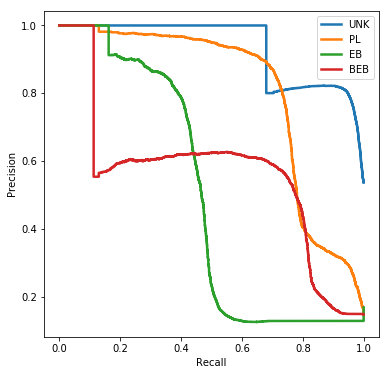

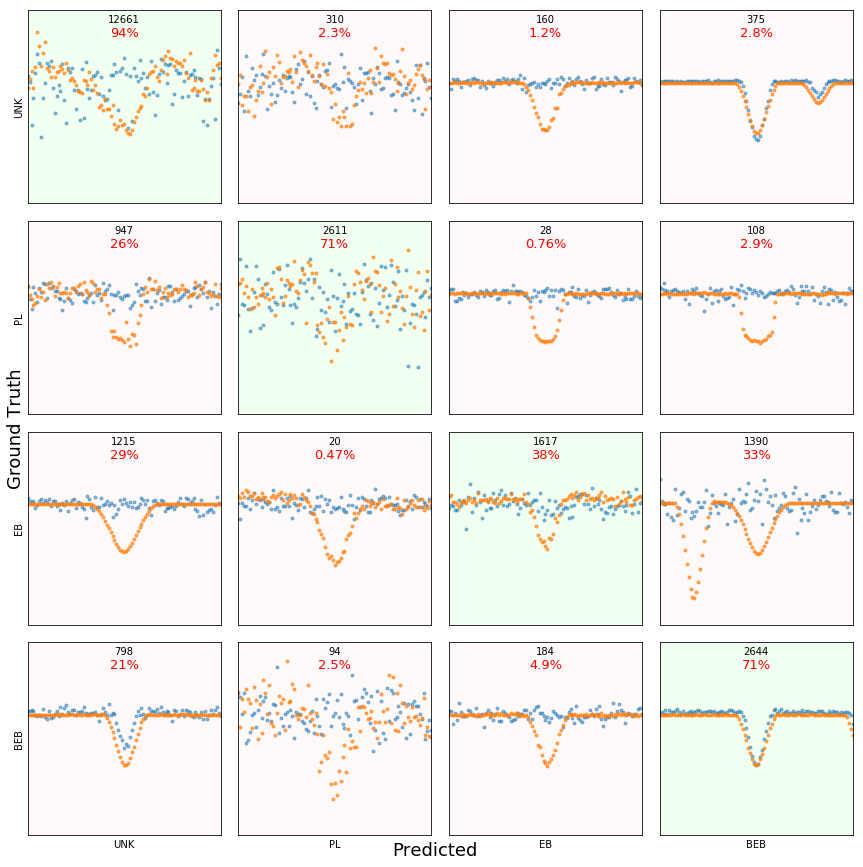

In [257]:
fold='/home/hosborn/TESS/final_runs/exonet_multiclass4_CV_final/'
newoutputvals,all_dics=Assemble_dic(fold,modeltype='4class')
MakePR(all_dics,fold,modeltype='4class')
MakeConfMat(all_dics,fold,sourcedat='/home/hosborn/TESS/processed_dvpdc_101/',modeltype='4class',lc2plot='local')

In [ ]:
outs=MakeMESplot(all_dics,fold,by='snr',bins=None,nbins=15,modeltype='4class',prev_df=outs[0])

4
0
1
2
3


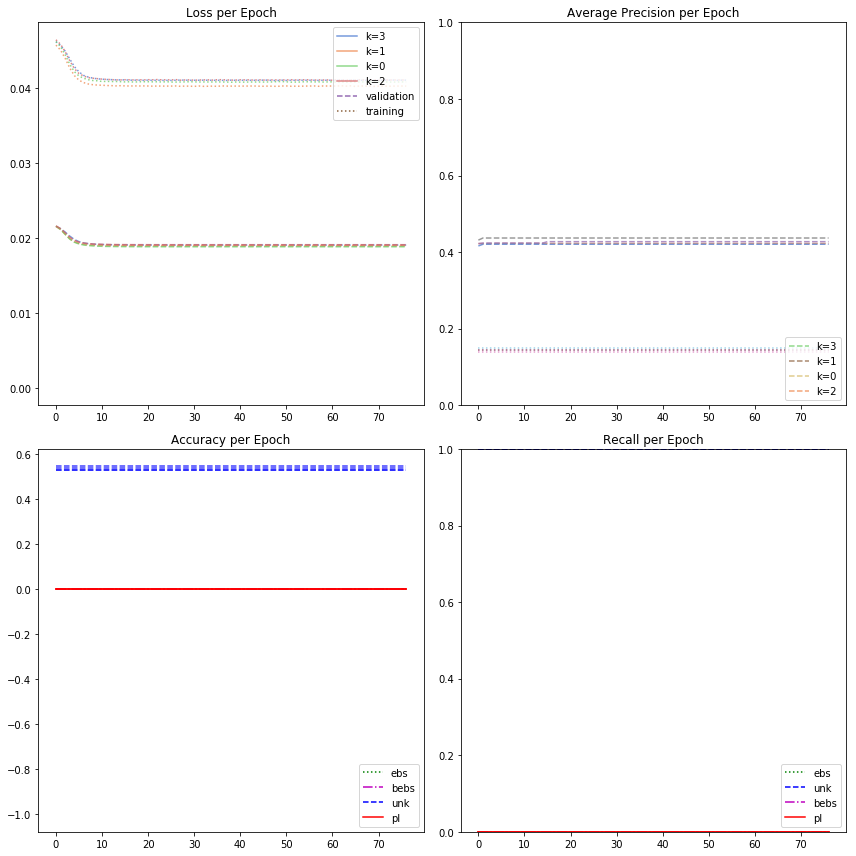

In [24]:
fold='/home/hosborn/TESS/final_runs/exonet_multiclass4_CV_globcents'
newoutputvals,all_dics=Assemble_dic(fold,use='tempdic',modeltype='4class')

ModelProgress(newoutputvals,fold,modeltype='4class')

4
0
1
2
3


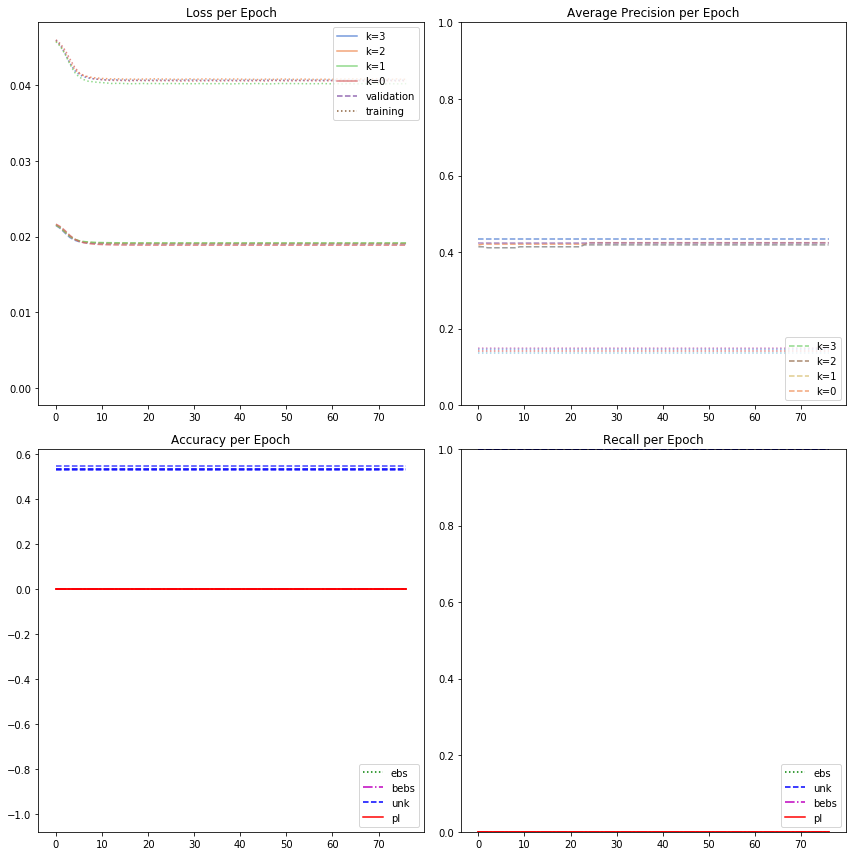

In [23]:
fold='/home/hosborn/TESS/final_runs/exonet_multiclass4_CV_globcents2'
newoutputvals,all_dics=Assemble_dic(fold,use='tempdic',modeltype='4class')

ModelProgress(newoutputvals,fold,modeltype='4class')

4
0
1
2
3


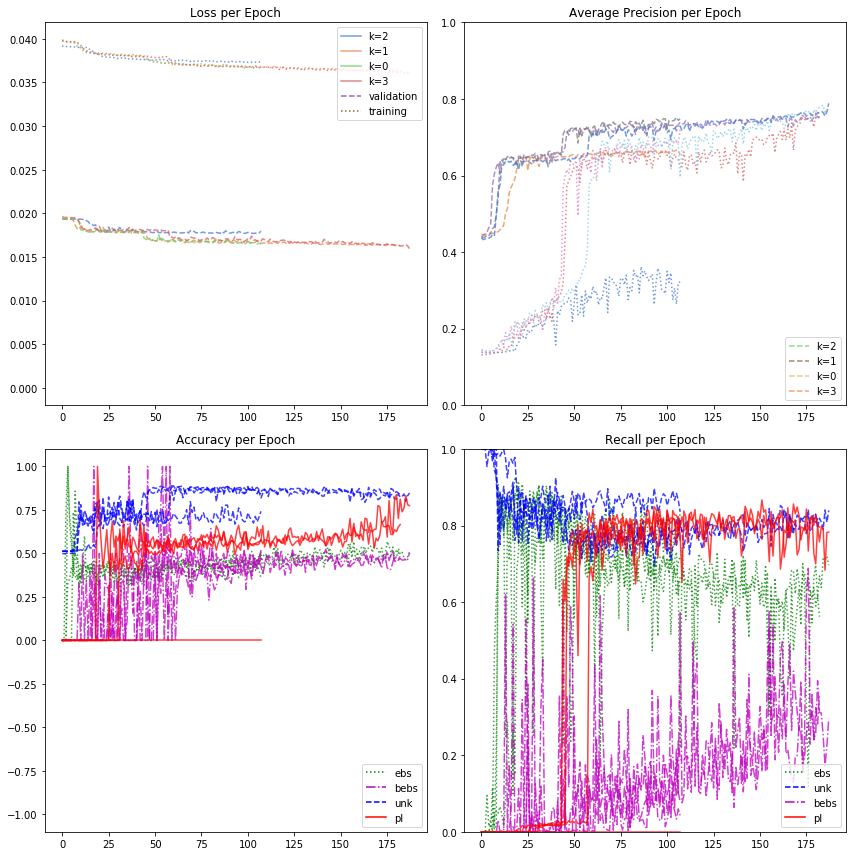

In [27]:
fold='/home/hosborn/TESS/final_runs/exonet_multiclass4_CV_globcents3'
newoutputvals,all_dics=Assemble_dic(fold,use='tempdic',modeltype='4class')

ModelProgress(newoutputvals,fold,modeltype='4class')

4
0
1
2
3


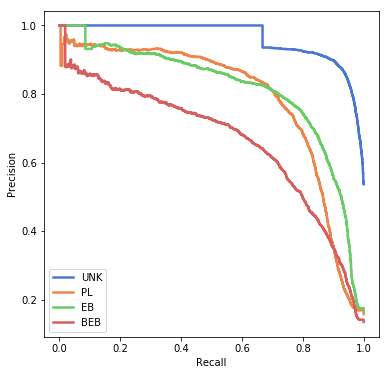

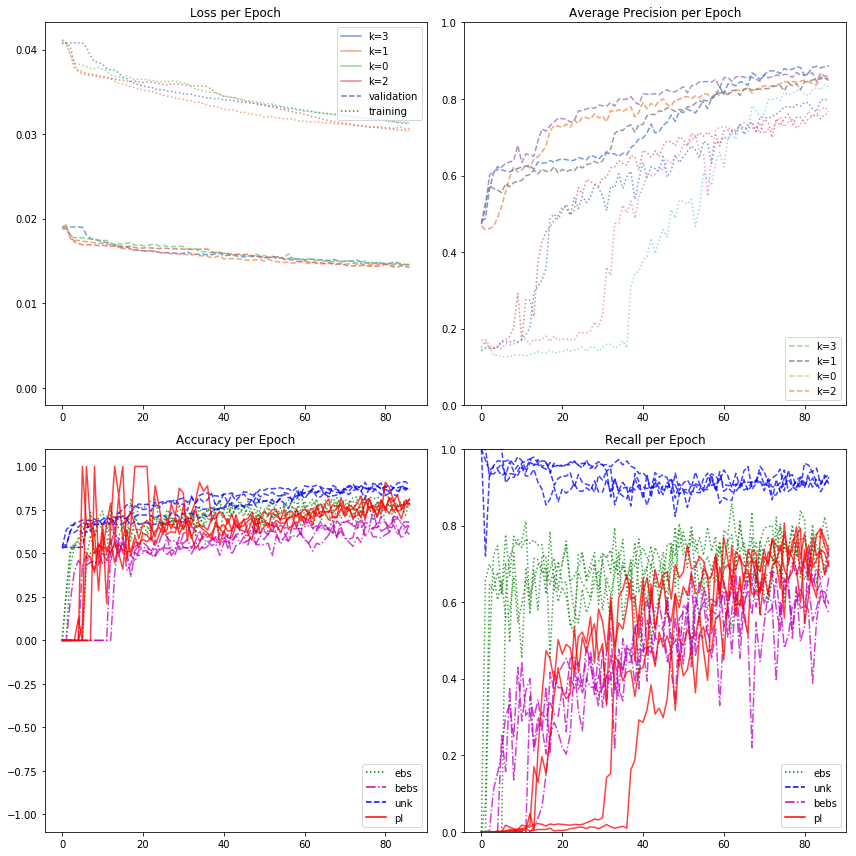

In [56]:
fold='/home/hosborn/TESS/final_runs/exonet_multiclass4_CV_globcents3b'
newoutputvals,all_dics=Assemble_dic(fold,use='tempdic',modeltype='4class')
MakePR(all_dics,fold,modeltype='4class')
ModelProgress(newoutputvals,fold,modeltype='4class')

4
0
1
2
3


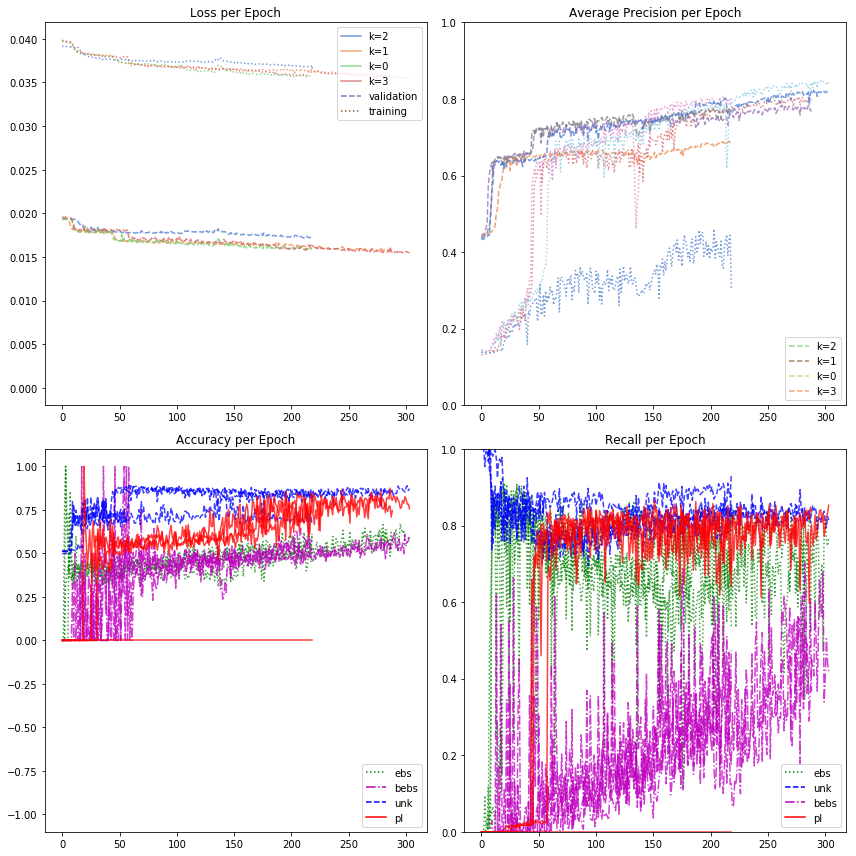

In [54]:
fold='/home/hosborn/TESS/final_runs/exonet_multiclass4_CV_globcents3'
newoutputvals,all_dics=Assemble_dic(fold,use='tempdic',modeltype='4class')
ModelProgress(newoutputvals,fold,modeltype='4class')

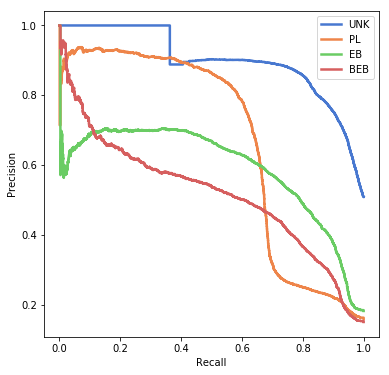

In [55]:
MakePR(all_dics,fold,modeltype='4class')


8
0
1
2
3
4
5
6
7


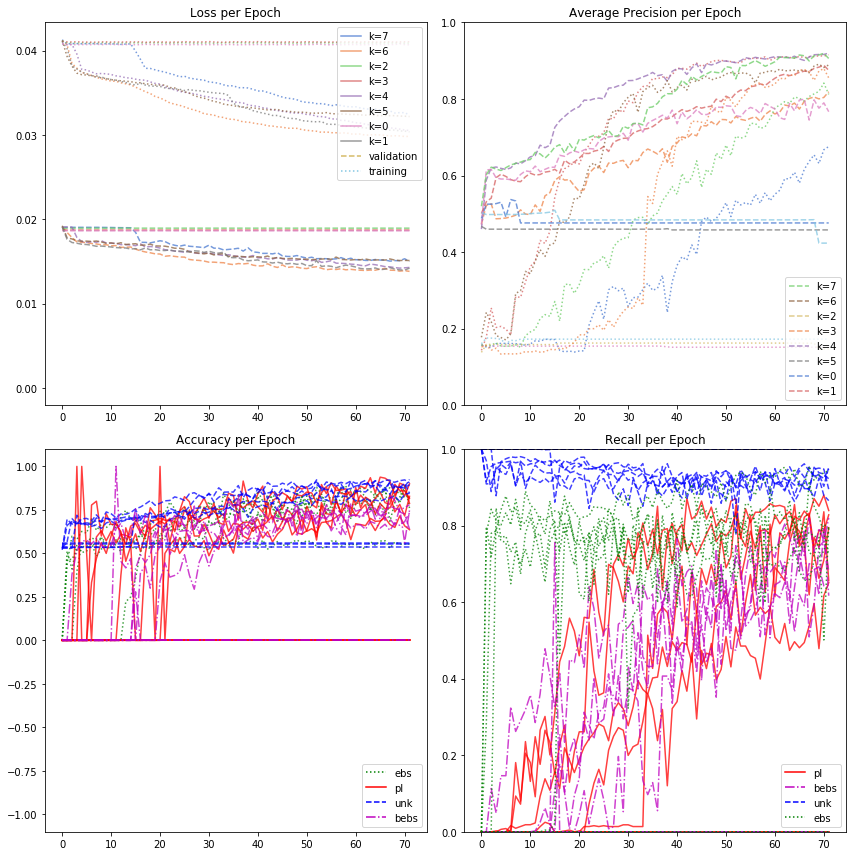

In [17]:
fold='/home/hosborn/TESS/final_runs/exonet_multiclass4_CV_globcents3b_k8'
newoutputvals,all_dics=Assemble_dic(fold,use='tempdic',modeltype='4class')
ModelProgress(newoutputvals,fold,modeltype='4class')

8
0
1
2
3
4
5
6
7


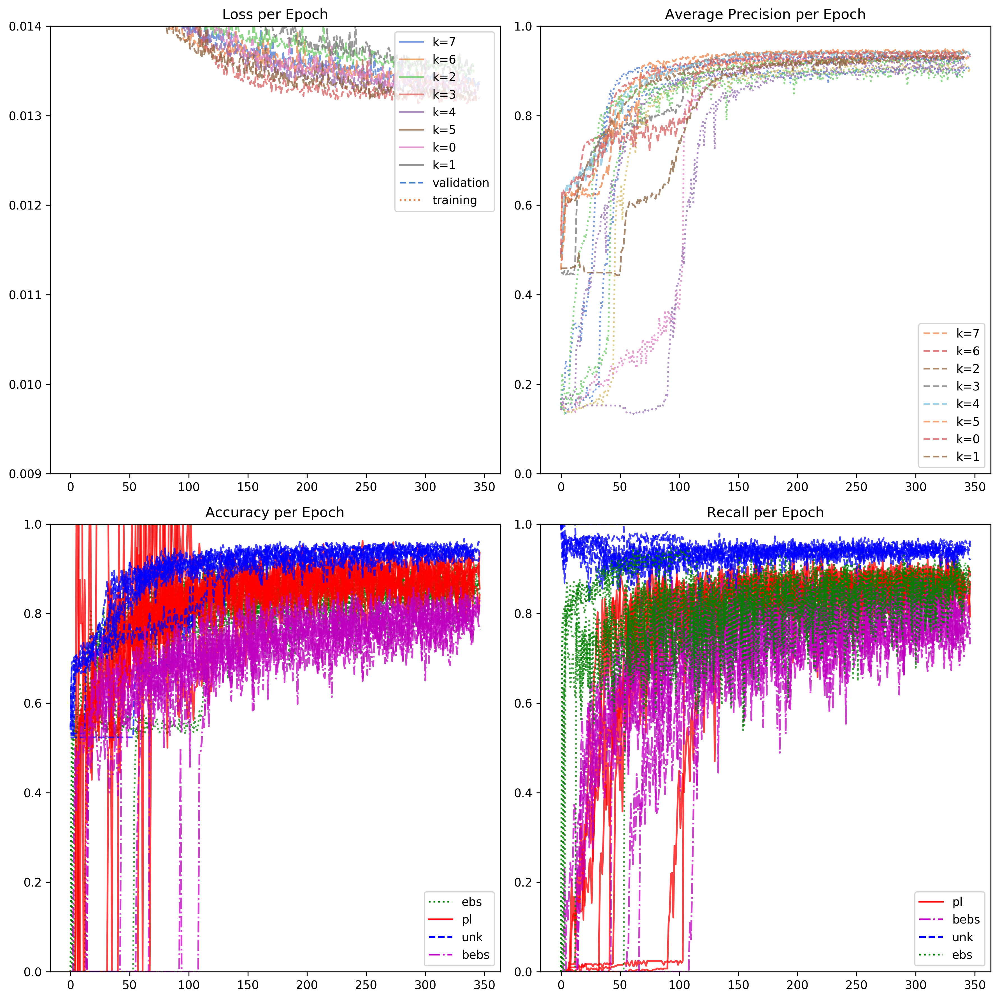

In [52]:
fold='/home/hosborn/TESS/final_runs/exonet_multiclass4_CV_globcents3b_k8'
newoutputvals,all_dics=Assemble_dic(fold,use='tempdic',modeltype='4class')
ModelProgress(newoutputvals,fold,modeltype='4class')

8
0
1
2
3
4
5
6
7


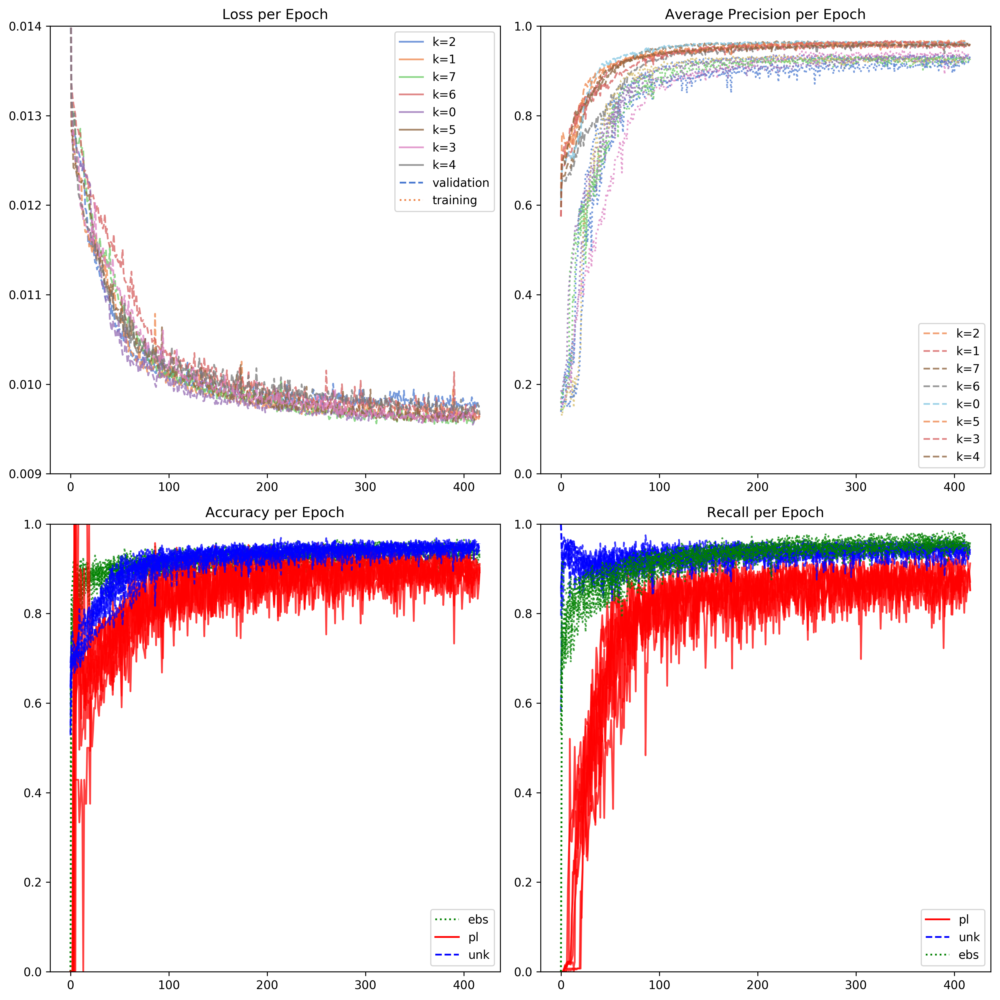

In [44]:
fold='/home/hosborn/TESS/final_runs/exonet_multiclass3_CV_globcents3b_k8'
newoutputvals,all_dics=Assemble_dic(fold,use='tempdic',modeltype='3class')
ModelProgress(newoutputvals,fold,modeltype='3class')

8
0
1
2
3
4
5
6
7


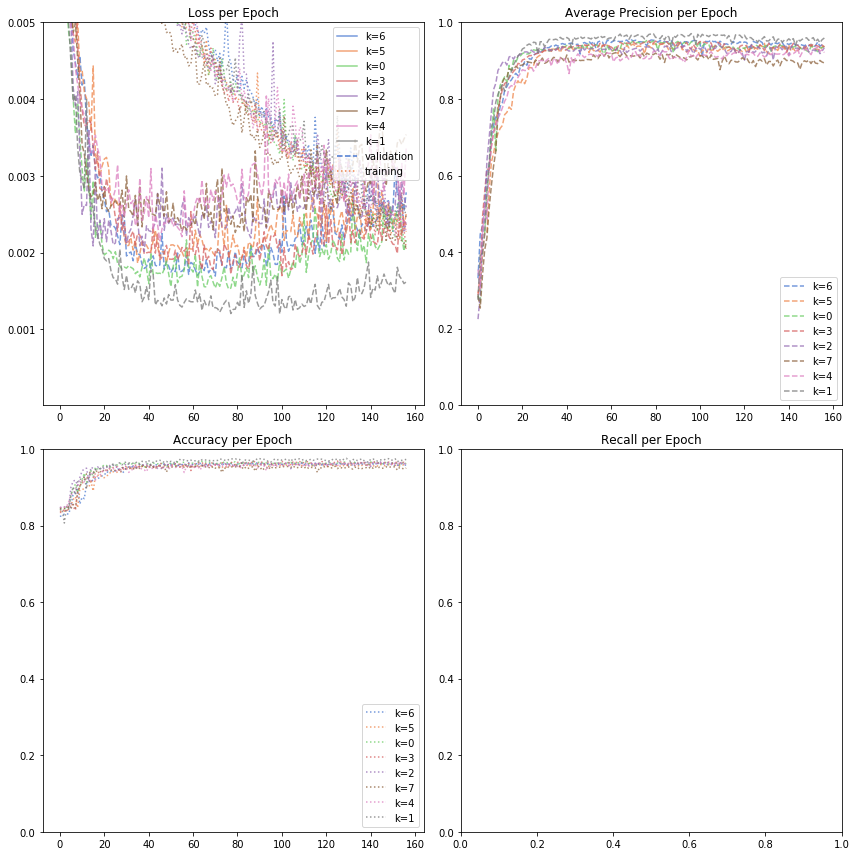

In [9]:
fold='/home/hosborn/TESS/final_runs/exonet_binary_CV_globcents3b_k8'
newoutputvals,all_dics=Assemble_dic(fold,use='tempdic',modeltype='binary')
ModelProgress(newoutputvals,fold,modeltype='binary',lossy=[0.00001,0.005])

/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:20: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


TypeError: unorderable types: numpy.ndarray() < str()

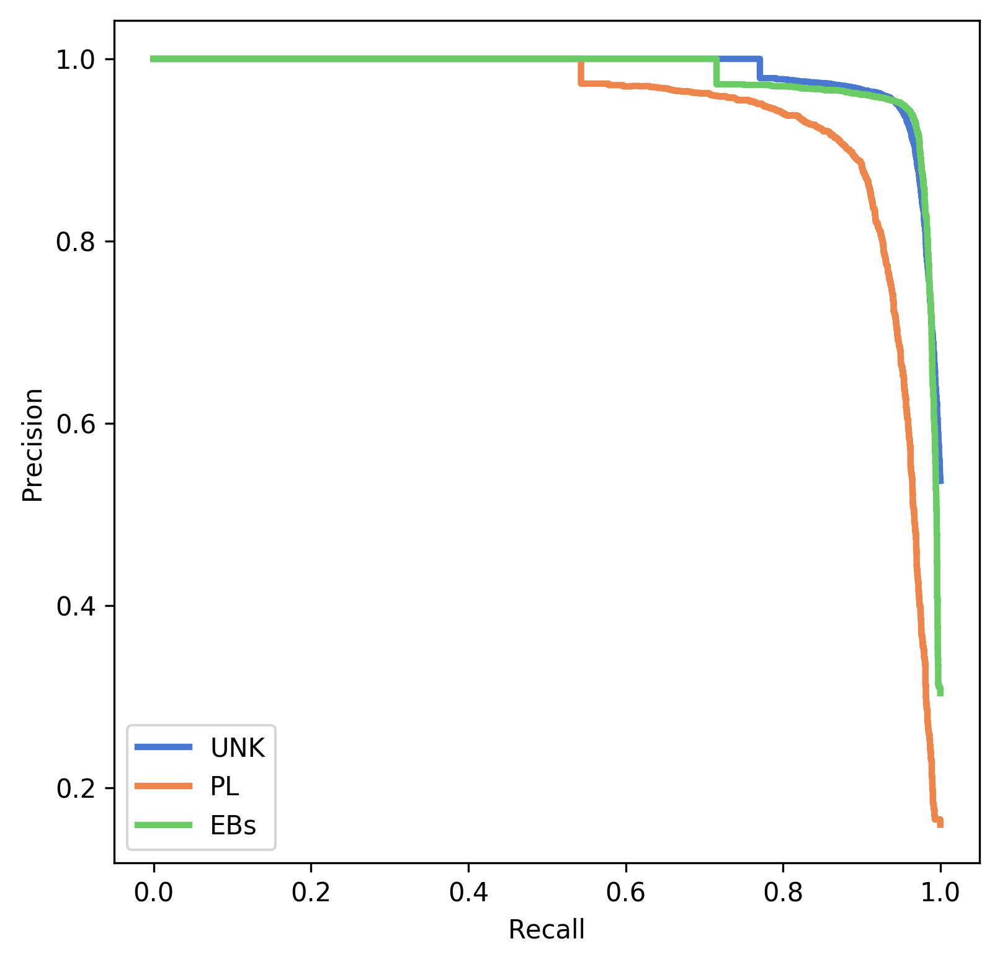

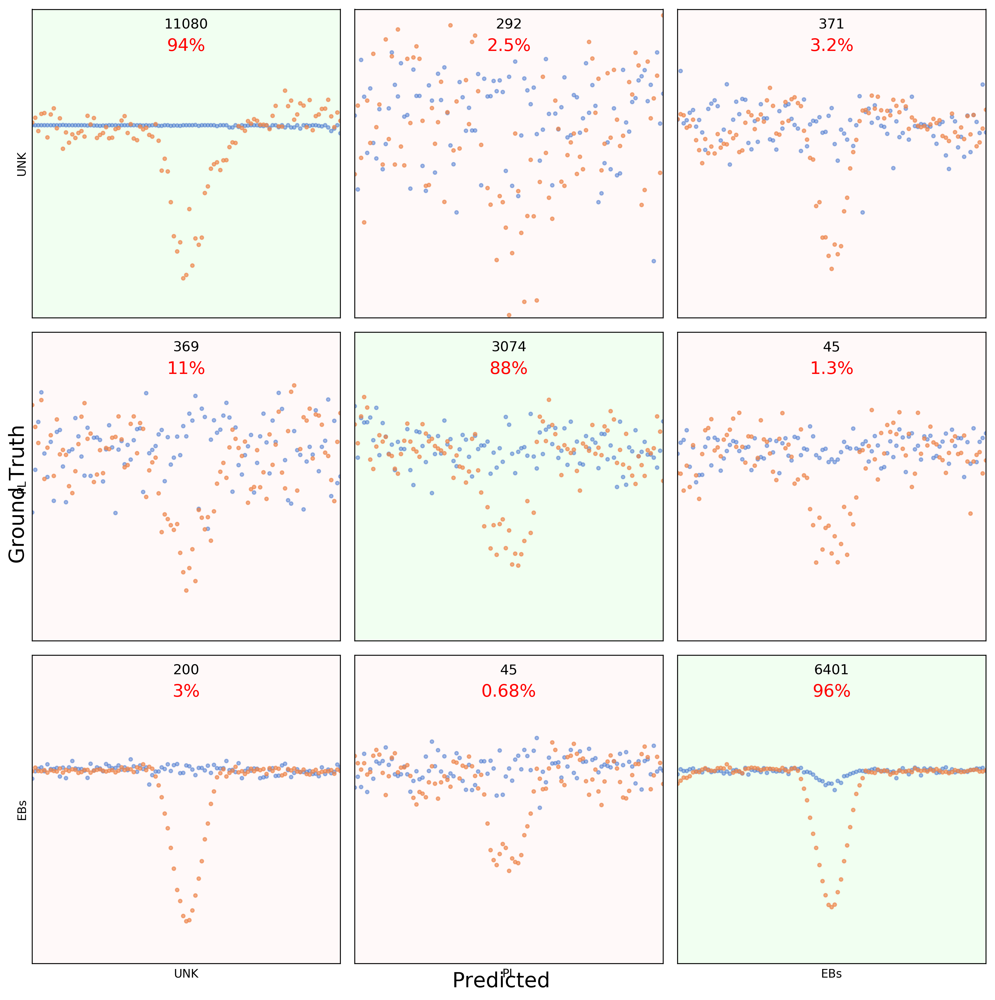

In [46]:
fold='/home/hosborn/TESS/final_runs/exonet_binary_CV_globcents3b_k8'
newoutputvals,all_dics=Assemble_dic(fold,use='tempdic',modeltype='binary')
ModelProgress(newoutputvals,fold,modeltype='binary',lossy=[0.00001,0.005])
MakePR(all_dics,fold,modeltype='3class')
MakeConfMat(all_dics,fold,sourcedat='/home/hosborn/TESS/processed_dvpdc_101/',modeltype='3class',lc2plot='local')
outdf=MakeMESplotDic(all_dics,fold,by='snr',bins=None,nbins=15,modeltype='binary')
outdf,binarray=MakeMESplot(outdf,fold,by='mes',bins=None,nbins=15,modeltype='binary')

In [10]:
outdf=MakeMESplotDic(all_dics,fold,by='snr',bins=None,nbins=15,modeltype='binary')
outdf,binarray=MakeMESplot(outdf,fold,by='mes',bins=None,nbins=15,modeltype='binary')

/home/hosborn/.local/lib/python3.5/site-packages/pandas/core/computation/expressions.py:180: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
/home/hosborn/.local/lib/python3.5/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


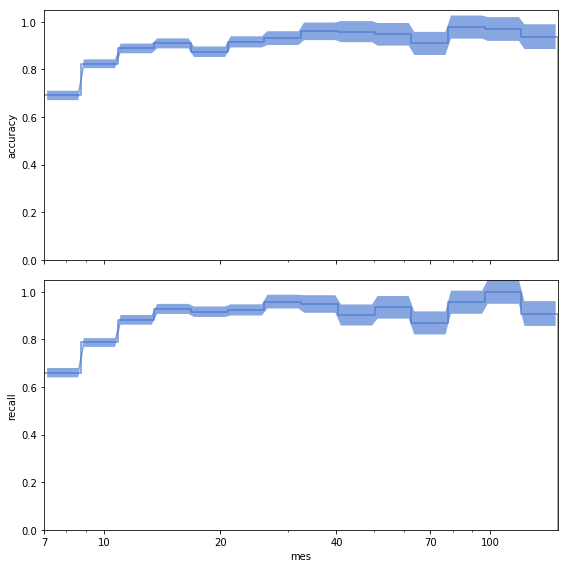

In [11]:
outdf,binarray=MakeMESplot(outdf,fold,by='mes',bins=None,nbins=15,modeltype='binary')

In [12]:
outdf

,depth,gt_class,mes,per,pred_class,snr
000001479793_00_01,27962.767570,2.0,23.656366,0.914964,0.0,50.755325
000002214365_00_01,5090.193752,0.0,11.903511,0.897781,0.0,23.253609
000002214365_01_01,13131.661146,3.0,32.862671,1.795474,0.0,67.072029
000003815360_00_04,80941.010961,3.0,183.315628,6.527870,0.0,199.190170
000003888273_00_04,14441.634211,0.0,8.228782,6.956030,0.0,5.769321
000003903969_00_04,1159.230208,1.0,7.921206,2.948265,1.0,9.643988
000005641447_00_03,103758.233648,2.0,606.100403,4.144881,0.0,530.927246
000005717524_00_03,1083.143362,1.0,10.535357,1.579442,1.0,12.757216
000005725904_00_03,18540.262678,0.0,7.488106,17.938320,0.0,7.871629
000005796540_00_03,77609.074965,2.0,10.334929,1.393475,0.0,11.789062


TypeError: unorderable types: numpy.ndarray() < str()

In [ ]:
xfxa

15 485


(-1, 77)

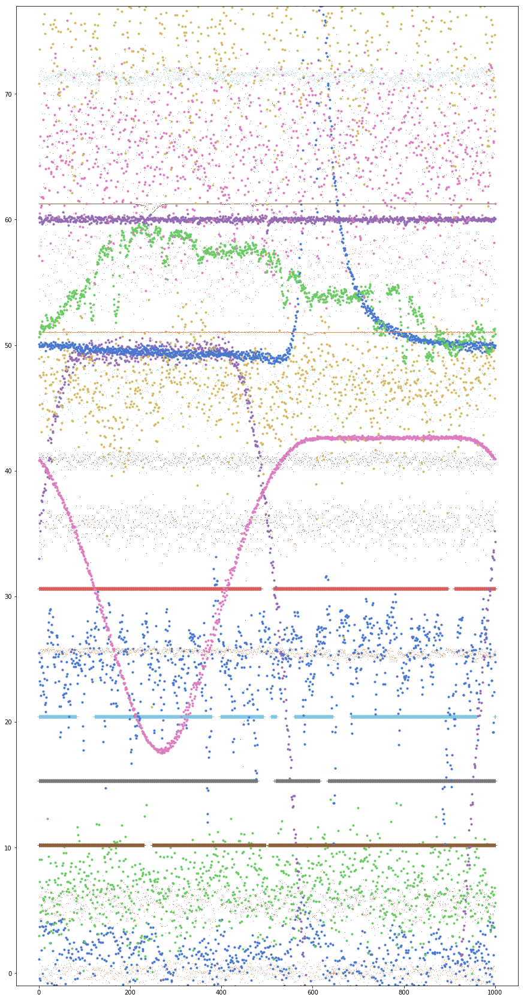

In [46]:
plt.figure(figsize=(15,30))
nlc=[]
nok=[]
for file in newoutputvals['/home/hosborn/TESS/final_runs/exonet_multiclass4_CV_globcents3/exonet_CV_2.4_101_all_Big']['val_files'][:500]:
    lc=np.load(file.replace('_info','_glob'))
    if np.sum(lc[:,0]==0.0)>100 or np.std(abs(lc[:,0]))>2 or np.median(abs(lc[:,0]))>2 or np.sum(lc[:,1]==0.0)>100 or np.std(abs(lc[:,1]))>2 or np.median(abs(lc[:,1]))>2:
        pts=plt.plot(5*len(nlc)+lc[:,0],'.')
        plt.plot(np.arange(1001)[lc[:,0]==0.0],np.tile(5*len(nlc),np.sum(lc[:,0]==0.0)),'o',color=pts[0].get_color())
        pts=plt.plot(5.1*len(nlc)+lc[:,1],',')
        plt.plot(np.arange(1001)[lc[:,1]==0.0],np.tile(5.1*len(nlc),np.sum(lc[:,1]==0.0)),'+',color=pts[0].get_color())
        nlc+=[file]
    else:
        nok+=[file]
print(len(nlc),len(nok))
plt.ylim(-1,5*len(nlc)+2)

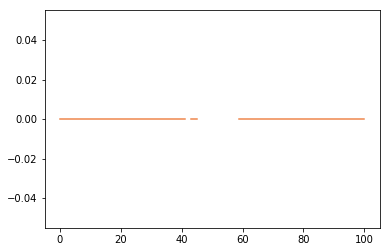

In [48]:
plt.plot(np.load(nlc[2].replace('info','loc')))

In [50]:
nlc[2]

'/home/hosborn/TESS/processed_dv_101_centfixed/nan_free/000012433730_01_03_info.npy'

4
0
1
2
3


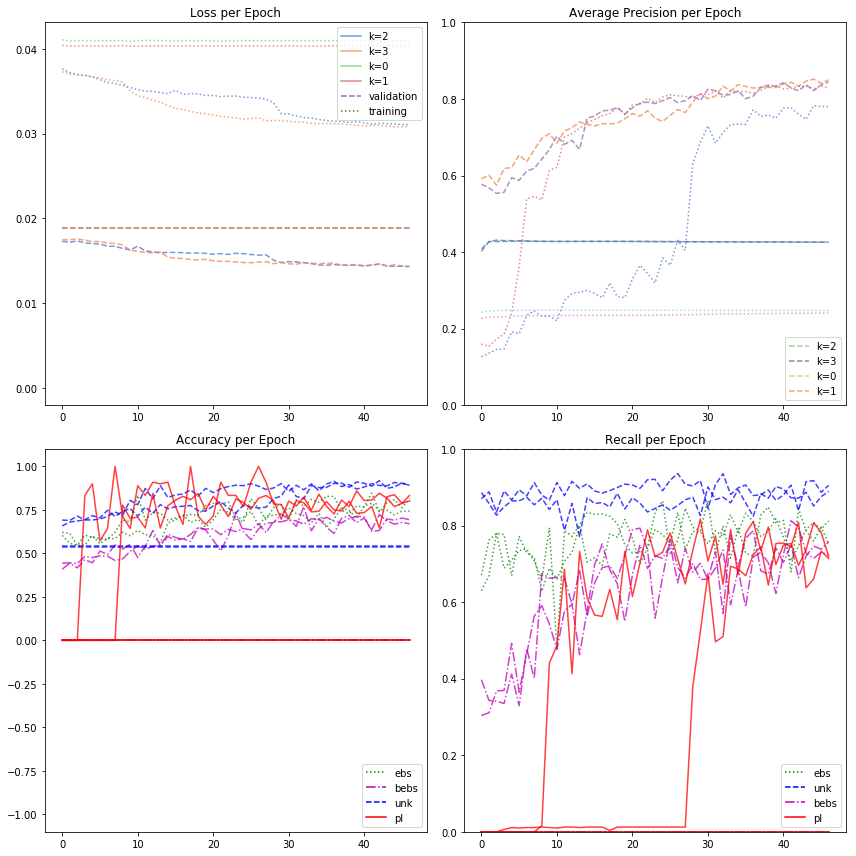

In [25]:
fold='/home/hosborn/TESS/final_runs/exonet_multiclass4_CV_globcents4'
newoutputvals,all_dics=Assemble_dic(fold,use='tempdic',modeltype='4class')

ModelProgress(newoutputvals,fold,modeltype='4class')

In [306]:
outs[1][:,4]

array([0.61142857, 0.73584906, 0.73584906, 0.84832905, 0.84832905,
       0.86052009, 0.86052009, 0.88888889, 0.88888889, 0.91059603,
       0.91059603, 0.95510204, 0.95510204, 0.95299145, 0.95299145,
       0.95138889, 0.95138889, 0.94117647, 0.94117647, 0.91428571,
       0.91428571, 0.98076923, 0.98076923, 0.88235294, 0.88235294,
       1.        , 1.        , 0.        ])

In [293]:
bbin=outs[0].loc[(outs[0]['snr']>7)*(outs[0]['snr']<8)]
np.sum(bbin.gt_class==bbin.pred_class)/len(bbin)

0.9154589371980676

In [294]:
1.0/np.sqrt(len(bbin))

0.02837521769195829

5
0
1
2
3
4


/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:20: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


IndexError: boolean index did not match indexed array along dimension 0; dimension is 25162 but corresponding boolean dimension is 25266

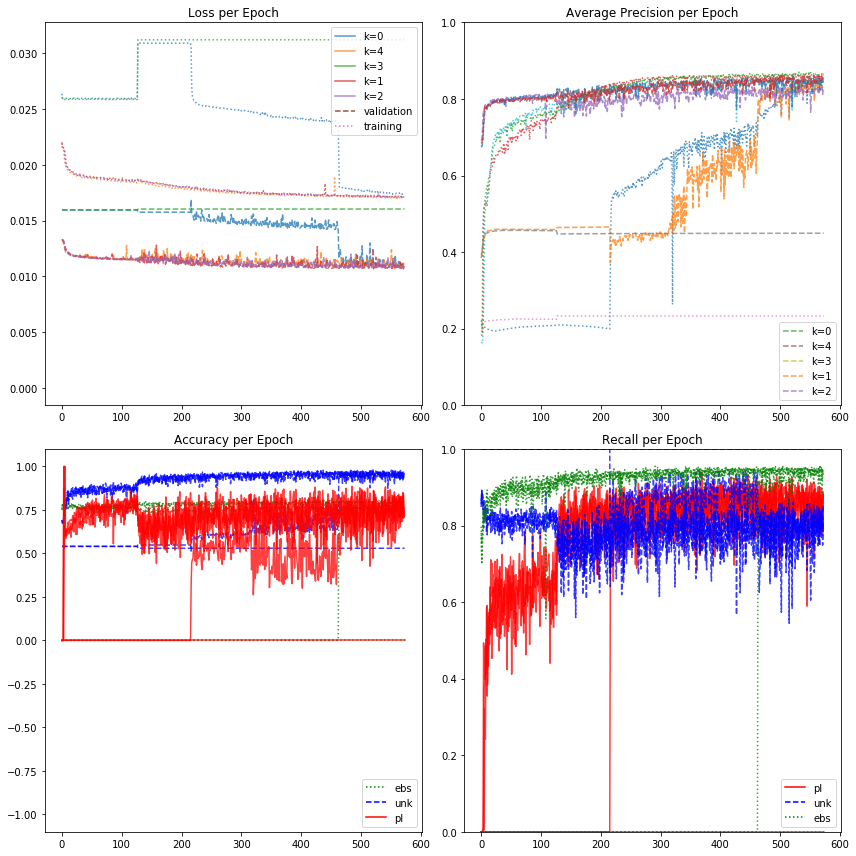

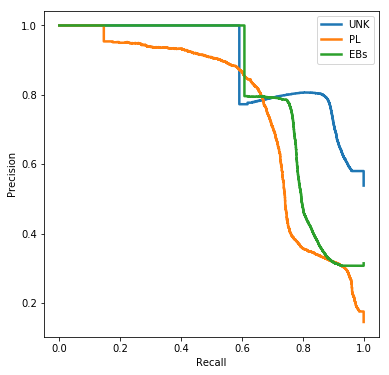

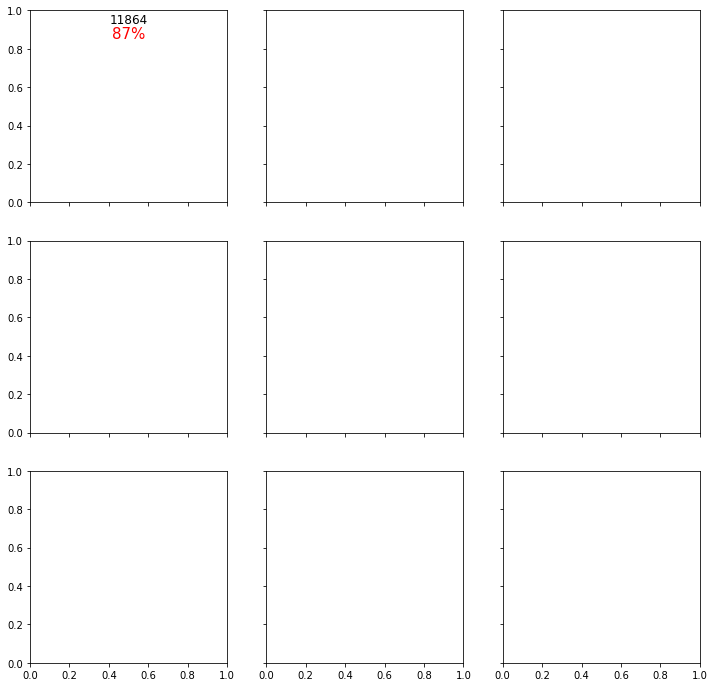

In [191]:
fold='/home/hosborn/TESS/final_runs/exonet_multiclass3_CV_final/'
newoutputvals,all_dics=Assemble_dic(fold,modeltype='3class')
ModelProgress(newoutputvals,fold,modeltype='3class')
MakePR(all_dics,fold,modeltype='3class')
MakeConfMat(all_dics,fold,sourcedat='/home/hosborn/TESS/processed_dvpdc_101/',modeltype='3class',lc2plot='local')

In [189]:
newoutputvals['/home/hosborn/TESS/final_runs/exonet_multiclass3_CV_final/exonet_CV_0.5_101_all_Big'].keys()

dict_keys(['ap_val_epoch', 'val_files', 'ap_val_epoch_pl', 'recall_val_epoch_ebs', 'acc_val_epoch_pl', 'pred_val_final', 'recall_val_epoch_pl', 'loss_val_epoch', 'loss_train_epoch', 'epoch', 'gt_val_final', 'recall_val_epoch_unk', 'ap_val_epoch_ebs', 'acc_val_epoch_ebs', 'optimizer', 'ap_val_epoch_unk', 'acc_val_epoch_unk', 'k'])

5
0
1
2
3
4


/home/hosborn/.local/lib/python3.5/site-packages/ipykernel_launcher.py:20: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.


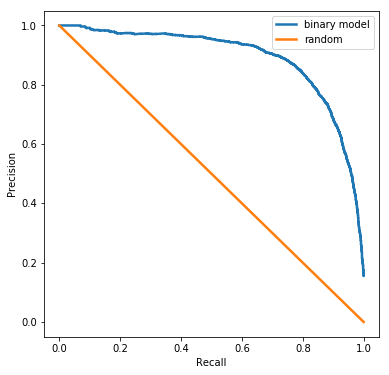

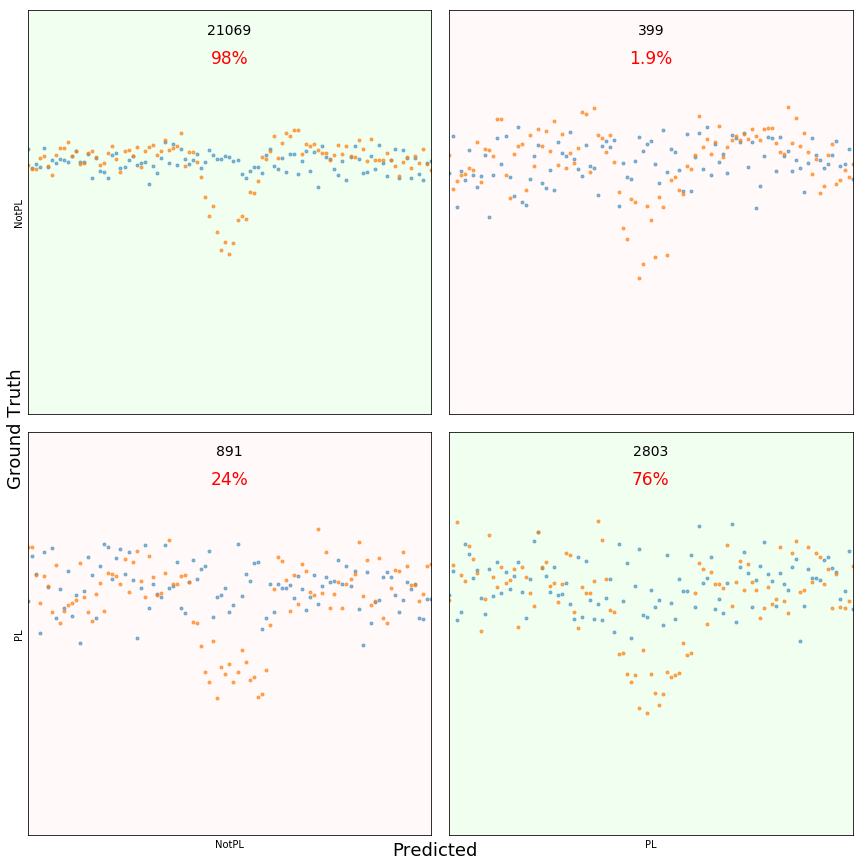

In [183]:
fold='/home/hosborn/TESS/final_runs/exonet_binary_CV_final/'
newoutputvals,all_dics=Assemble_dic(fold,modeltype='binary')
MakePR(all_dics,fold,modeltype='binary')
MakeConfMat(all_dics,fold,sourcedat='/home/hosborn/TESS/processed_dvpdc_101/',modeltype='binary',lc2plot='local')

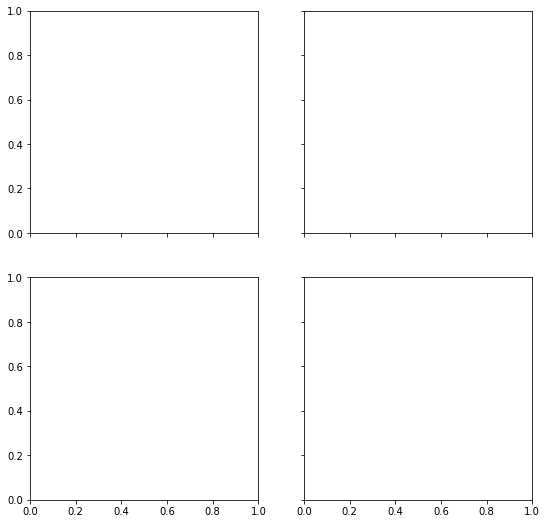

In [62]:
fig, axs = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, figsize=(9, 9))
axs[0][0]

In [66]:
axs[0][0]

In [18]:
arr=np.random.random((4,4))
print(arr)
print(np.sum(arr,axis=1))

[[0.12881773 0.4669043  0.43143689 0.03789775]
 [0.19115805 0.17101421 0.16583665 0.28088521]
 [0.70492095 0.60106036 0.9582449  0.35573342]
 [0.39569964 0.43992338 0.73515361 0.95124777]]
[1.06505667 0.80889412 2.61995963 2.5220244 ]


In [34]:
nn.Linear?